In [1]:
import cv2 
import ast
%matplotlib inline
import numpy as np
import matplotlib.pylab as plt
from os import listdir
import pandas as pd
from scipy import interpolate
from scipy import ndimage
from tools import Tools

In [2]:
data = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/numpy arrays/interpolated.npy")
labels = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/numpy arrays/interpolated_labels.npy")

In [25]:
def normalize(data):
    """
    normalizes across frames - axix to zero mean and standard deviation
    """
    M,N, nr_joints,_ = data.shape
    means = np.array([np.mean(ex) for ex in data])
    std = np.array([np.std(ex) for ex in data])
    data_new = [(data[i]-means[i])/(std[i]+0.000001) for i in range(len(data))]
    return np.array(data_new)

(6422,)
(6422,)
[ -1.70189877e-16  -1.13459918e-16   4.53839672e-16 ...,   9.92774282e-17
   6.80759507e-16   3.40379754e-16]


In [16]:
unique = np.unique(new_labels)
index_liste = []
for pitches in unique:
    index_liste.append(np.where(new_labels==pitches))

JOINT:  0


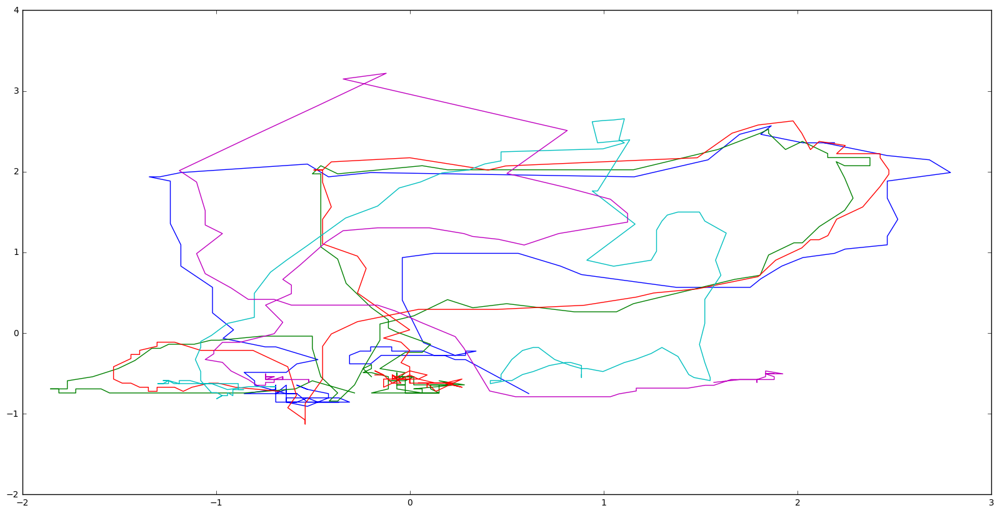

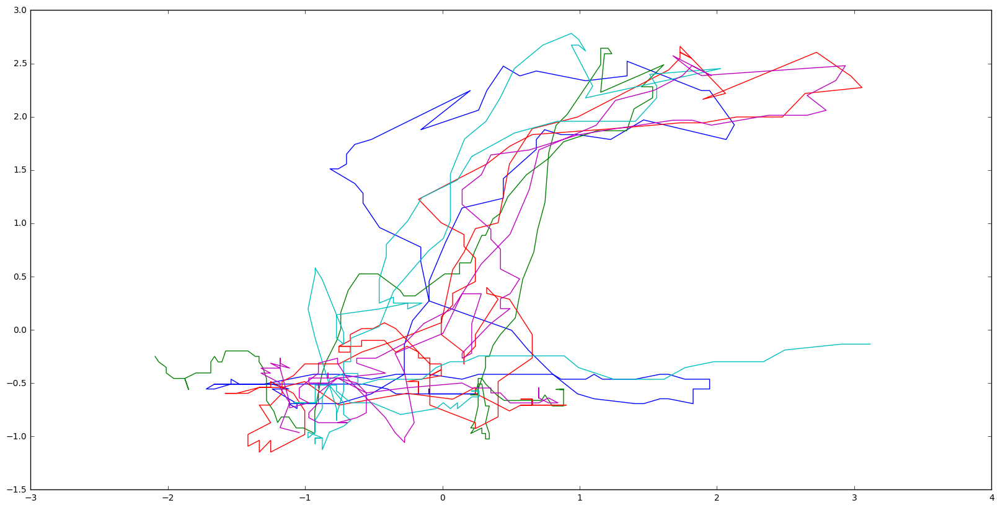

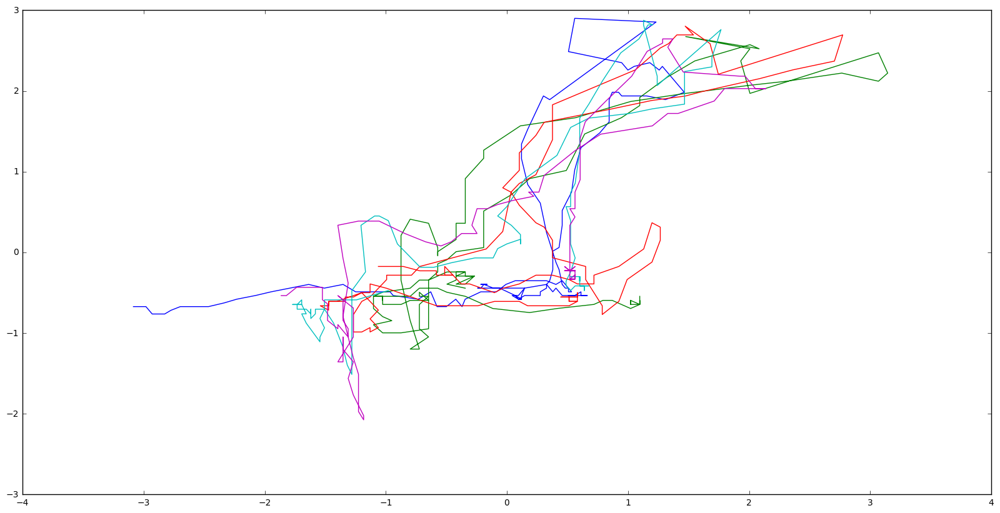

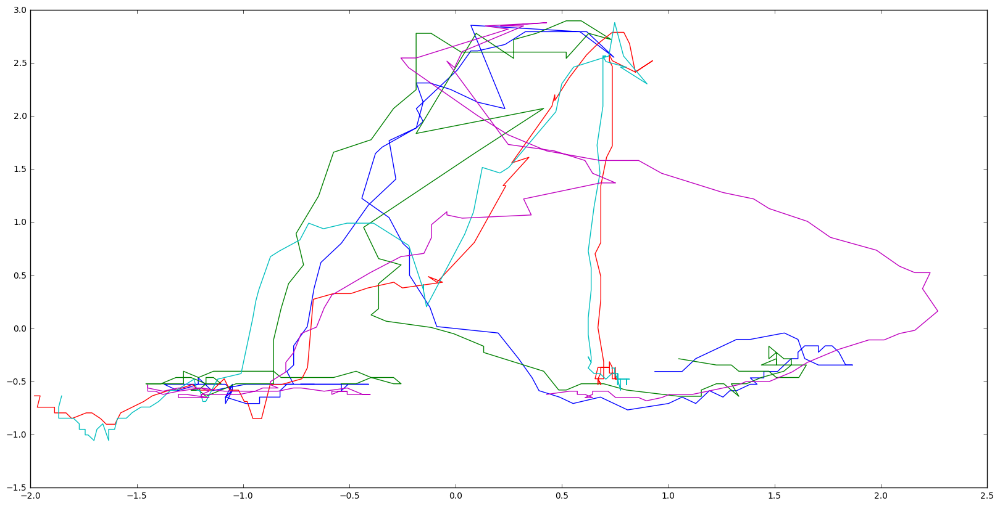

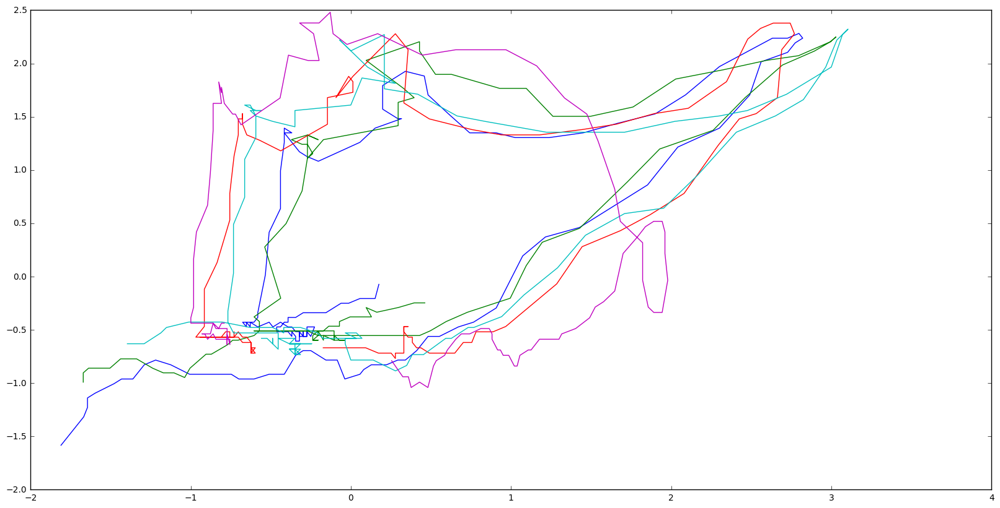

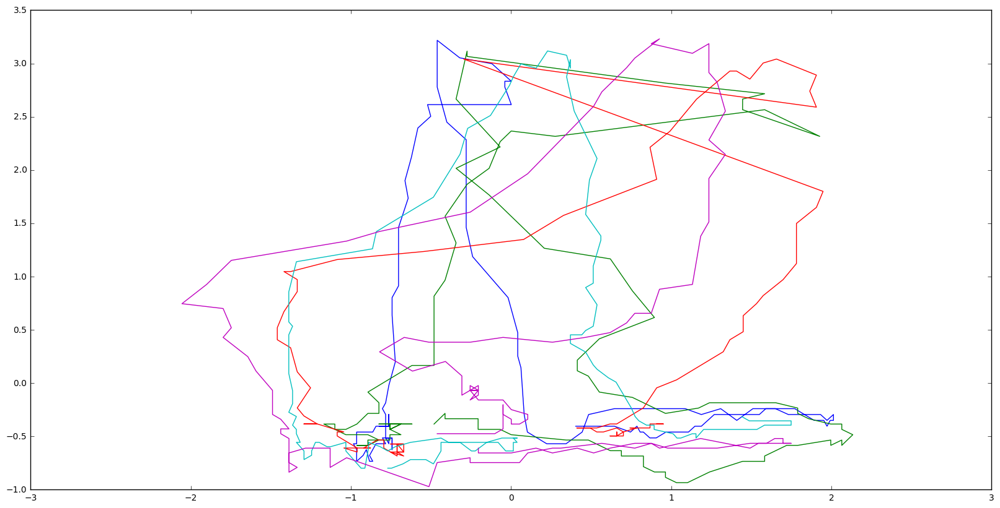

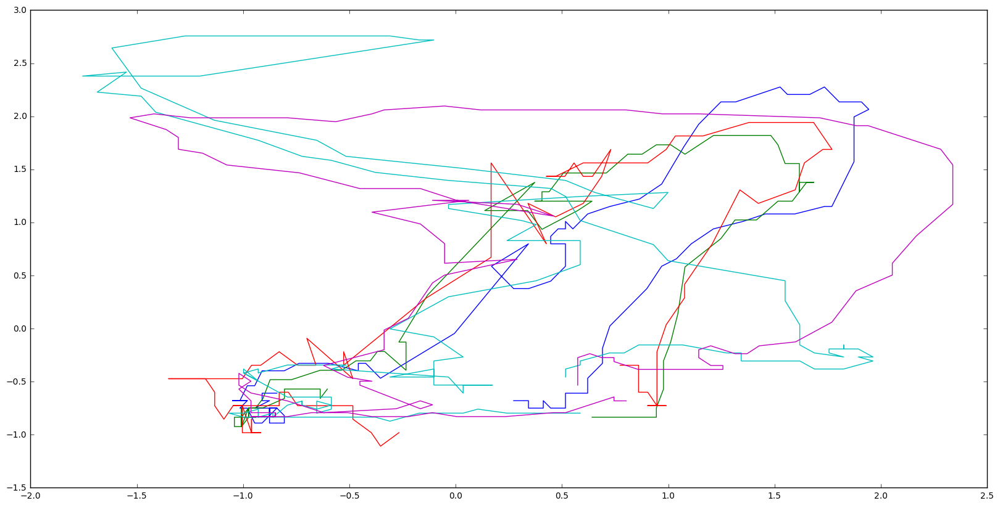

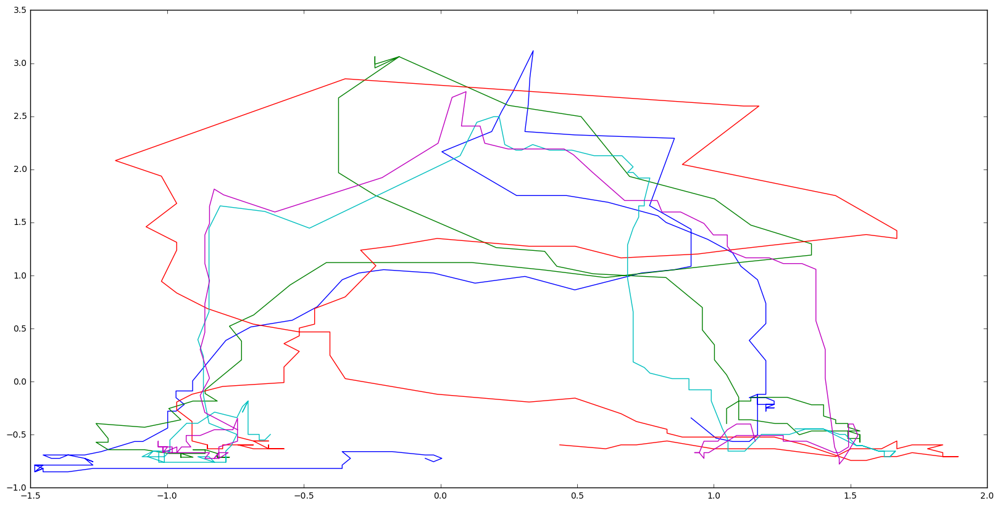

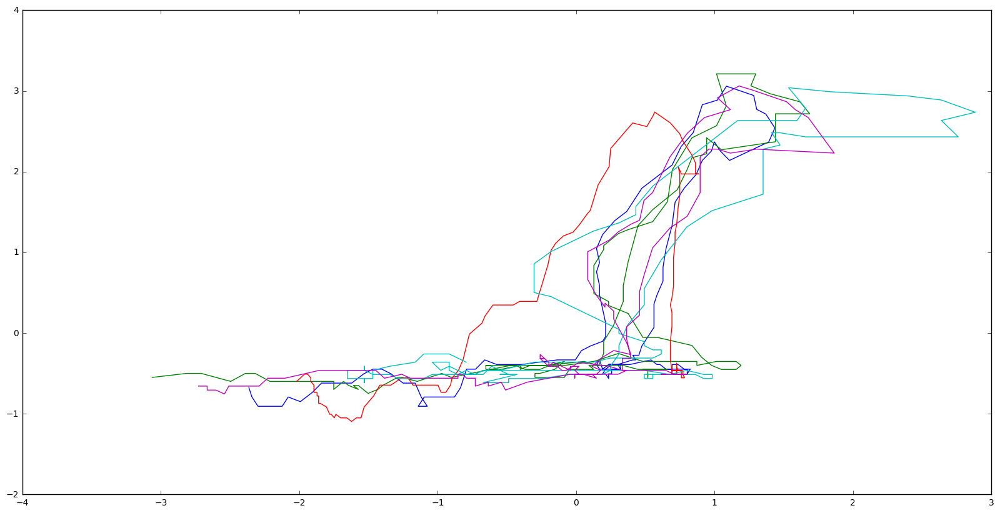

In [36]:
joints=["Right shoulder", "Left shoulder", "Right elbow", "Right wrist","Left elbow", "Left wrist",
        "Right hip", "Right knee", "Right ankle", "Left hip", "Left knee", "Left ankle", "Neck ", 
        "Right eye", "Right ear","Left eye", "Left ear"]
#aligned = Tools.align_frames(data, pre.get_release_frame(60, 120), 60, 40)
aligned = Tools.normalize(data)
ALIGNING = True
ERRORBAR = False
JOINT = 0
NR_JOINTS = 12
nr_examples = 5 #len(data) # 100
cutoff_example_nr = 30


print("JOINT: ", JOINT)
for j in range(len(index_liste)):
    stds = 0
    #print(index_liste[j][0])
    #print(index_liste[j][0][len(index_liste[j][0])//2:len(index_liste[j][0])//2+nr_examples])
    # nr_examples = len(index_liste[j][0])    #100
    index = index_liste[j][0][:nr_examples]
    #index2 = index_liste[j][0][len(index_liste[j][0])//2:len(index_liste[j][0])//2+nr_examples]
    if ALIGNING:
        frame = aligned[index]
    #    frame2 = aligned[index2]
    else:
        frame = data[index]
    #    frame2 = new_data[index2]
    plt.figure(figsize=(20,10))
    x = frame[:, :, JOINT,1]
    y = frame[:, :,JOINT,0]
    #x2 = frame2[:, :, JOINT,1]
    #y2 = frame2[:, :,JOINT,0]
    for k, exa in enumerate(x):
        #if sum(abs(exa-meX))< np.median(error) and nr<cutoff_example_nr:
        plt.plot(exa, y[k])
    #    plt.plot(x2[k], y2[k], c = "red")
    #plt.ylim(-3, 3)
    #plt.xlim(-3, 3)
    #plt.legend()
    plt.show()

In [40]:
from data_preprocess import Preprocessor
prepro = Preprocessor("cf_data.csv")
rel = prepro.get_release_frame(60, 120)

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


csv eingelesen with length  13150
Only Pitcher rows


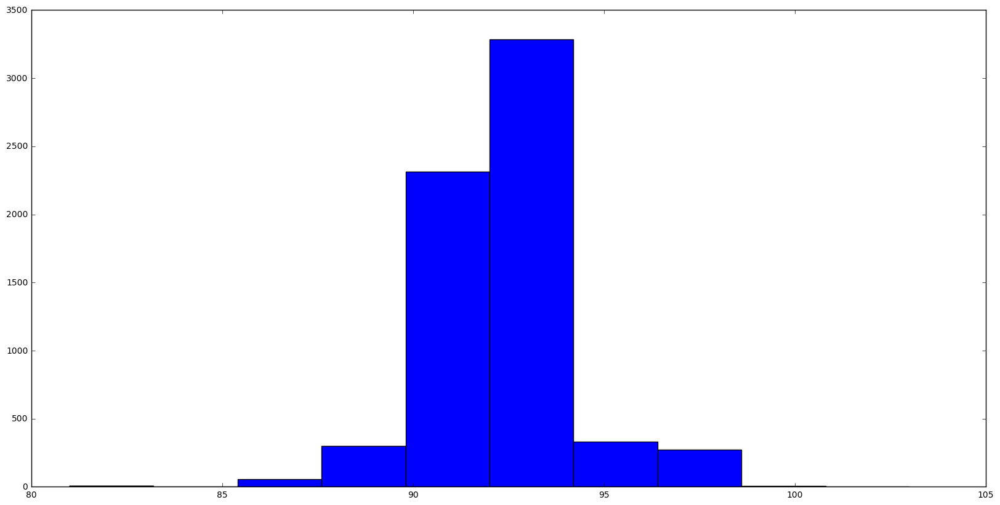

In [43]:
plt.figure(figsize = (20,10))
plt.hist(rel)
plt.show()

In [45]:
print(np.bincount(np.asarray(rel, dtype = int)))

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    2    1    3    0    3    6   48   91  210
  459 1856 1366 1172  746  255   75  259   13    3    4    0    2    1]


In [72]:
arr = ["2017-05-20", "2017-05-24", "2017-06-07",
 "2017-06-11", "2017-06-19", "2017-06-23", "2017-07-05", "2017-07-17", "2017-04-15", "2017-04-19", "2017-05-03", "2017-05-07","2017-04-14", "2017-04-18",
  "2017-05-02", "2017-05-06", "2017-05-19", "2017-05-23", "2017-06-06", "2017-06-10", "2017-06-18", "2017-06-22", "2017-07-04", "2017-07-16"]
print(len(arr))
print(len(np.unique(arr)))

24
24


In [ ]:
pos = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/numpy arrays/all_frames.npy")
pos = np.reshape(pos, (30,55,55))
print(pos.shape)
i=0
for pic in pos:
    print(i)
    i+=1
    plt.imshow(pic)
    plt.gray()
    plt.show()

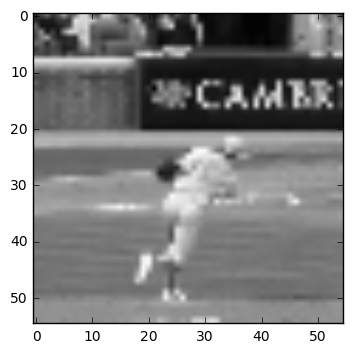

In [99]:
pos = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/numpy arrays/predicted_frame.npy")
pos = np.reshape(pos, (55,55))
plt.imshow(pos)
plt.gray()
plt.show()

SAVED MODELS: (test accuracy and balanced accuracy)
* cf data, all pitch types: 0.64
* cf data, 3 pitch types (fastball, breaking ball, changeup) only windup and 5 players with most pitches: 0.87, 0.91
* cf data, 3 pitch types (fastball, breaking ball, changeup) only windup and  all players: 0.79 0.65
* sv data, 3 pitch types (fastball, breaking ball, changeup) only windup and  all players: 0.6, 0.49
* cf data, 3 pitch types (fastball, breaking ball, changeup) only Stretch and 5 players with most pitches: 0.87, 0.79
* cf data, 3 pitch types (fastball, breaking ball, changeup) only Stretch and all players: 0.73, 0.6

    
PREDICT PITCHING POSITION (Stretch/Windup)
* modelPosition: cf data: 0.96 0.96
* modelPositionSV: sv data, 0.94 0.93

PREDICT RELEASE FRAME:
* on videos directly, predict from a range of the 80th until the 100th frame: 90% acc for a single frame 


In [ ]:
send carlos example of json file of joints

first movement frame (leg raised?)
put pitchtype, game id in csv file and send

In [103]:
import codecs
import json
obj_text = codecs.open("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/Pose_Estimation/out_joints/490555-88fa9ebc-01eb-448d-b60b-8826dbe6b8b9_joints.json", encoding='utf-8').read()
b_new = json.loads(obj_text)
pitcher_array = np.array(b_new)[:,:12,:]
print(pitcher_array.shape)


(167, 12, 2)


In [36]:
import pandas as pd
cf = pd.read_csv("cf_data.csv")

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [125]:
ids = cf["play_id"]
new_df = pd.DataFrame({"play_id":ids})
new_df["Pitch Type"] = pd.Series(np.array(labels))
new_df.to_csv("pitchtypes_test")

                                         play_id Pitch Type
0           49b51b3c-5260-4d06-b44d-0553adea105d       fast
1           49b51b3c-5260-4d06-b44d-0553adea105d       slow
2           95bdbdc2-454f-4dcb-a21c-afc087d35e27       fast
3           95bdbdc2-454f-4dcb-a21c-afc087d35e27       slow
4           2b8452c8-c23e-4e1f-9f5e-475d7b9d5bb9       fast
5           2b8452c8-c23e-4e1f-9f5e-475d7b9d5bb9       slow
6           c0063b86-7a43-4b8c-a603-c7d3fb52b02a       fast
7           c0063b86-7a43-4b8c-a603-c7d3fb52b02a       slow
8           b73fc5e5-e342-4472-b1cc-7f00a3b42426       fast
9           b73fc5e5-e342-4472-b1cc-7f00a3b42426       slow
10          f7247454-4c66-402e-9edb-f13d8630aa52       fast
11          f7247454-4c66-402e-9edb-f13d8630aa52       slow
12          01c04433-b8f6-4a3e-b27d-d934b1b922a1       fast
13          01c04433-b8f6-4a3e-b27d-d934b1b922a1       slow
14          3ed9d980-9478-4295-9342-065b0d2db7c6       fast
15          3ed9d980-9478-4295-9342-065b

In [9]:
import numpy as np
def save_in_csv(labels):
    try:
        new_df = pd.read_csv("pitchtypes_test.csv")
    except:
        ids = prepro.cf["play_id"]
        new_df = pd.DataFrame({"play_id":ids})
        print(len(ids.values))
    game_ids = prepro.cf["play_id"]
    #new_df["Pitching Position"] = pd.Series(np.array(labels))
    #for i in range(len(labels)):
    #    game = game_ids[i]
    #    ind = new_df[new_df["play_id"]==game].index.values[0]
    #    new_df.loc[str(ind), "modelName"] = labels[i]
    print("rows csv file: ", len(new_df.values))
    print("nr labels:", len(labels))
    new_df["Pitch Type"] = pd.Series(np.array(labels))
    #new_df.assign(pitching_position = pd.Series(np.array(labels)))
    new_df.to_csv("pitchtypes_test.csv")

lab = []
for i in range(3010):
    if i%2==0:
        lab.append("slow")
    else:
        lab.append("fast")
save_in_csv(lab)

rows csv file:  7336
nr labels: 3010


In [ ]:
lab = []
for i in range(13150):
    if i%2==0:
        lab.append("t1")
    else:
        lab.append("t2")
        
def save_in_csv(labels):
    dic ={}
    try:
        old_df = pd.read_csv("pitchtypes_test.csv")
        for col in old_df.columns.tolist():
            if col[:3]!="Unn":
                dic[col] = old_df[col].values
    except:
        dic["play_id"] = cf["play_id"].values

    games_in_cf = cf["play_id"].values.tolist()
    new_col = []
    games_in_dic = dic["play_id"]
    print(len(games_in_dic))
    #dic["new_col"]=lab
    for i in range(len(games_in_dic)):
        game = games_in_dic[i]
        print(games_in_cf.index(game))
        try:
            ind = games_in_cf.index(game)
            new_col.append(labels[ind])
        except:
            new_col.append(None)
    #print(new_col)
    dic["PitchingPosition2"] = new_col
    df = pd.DataFrame.from_dict(dic)
    df.to_csv("pitchtypes_test.csv")

save_in_csv(lab)

In [45]:
df = cf.drop(cf[cf["Game"].str.contains("490266")].index)
print(cf.values.shape)
print(df.values.shape)

(13150, 444)
(12952, 444)


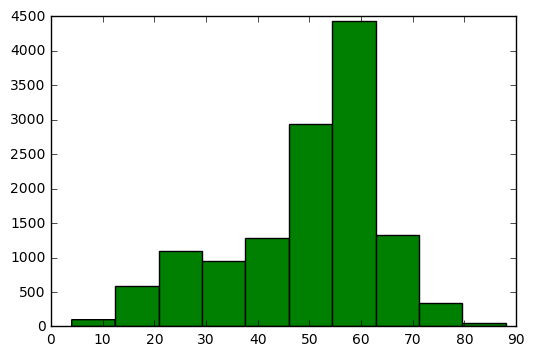

[ -6.60000000e+01  -6.20000000e+01  -5.20000000e+01  -5.10000000e+01
  -4.70000000e+01  -4.30000000e+01  -4.20000000e+01  -7.00000000e+00
   4.00000000e+00   5.00000000e+00   6.00000000e+00   7.00000000e+00
   8.00000000e+00   9.00000000e+00   1.00000000e+01   1.10000000e+01
   1.20000000e+01   1.30000000e+01   1.40000000e+01   1.50000000e+01
   1.60000000e+01   1.70000000e+01   1.80000000e+01   1.90000000e+01
   2.00000000e+01   2.10000000e+01   2.20000000e+01   2.30000000e+01
   2.40000000e+01   2.50000000e+01   2.60000000e+01   2.70000000e+01
   2.80000000e+01   2.90000000e+01   3.00000000e+01   3.10000000e+01
   3.20000000e+01   3.30000000e+01   3.40000000e+01   3.50000000e+01
   3.60000000e+01   3.70000000e+01   3.80000000e+01   3.90000000e+01
   4.00000000e+01   4.10000000e+01   4.20000000e+01   4.30000000e+01
   4.40000000e+01   4.50000000e+01   4.60000000e+01   4.70000000e+01
   4.80000000e+01   4.90000000e+01   5.00000000e+01   5.10000000e+01
   5.20000000e+01   5.30000000e+01

In [57]:
import matplotlib.pylab as plt
#plt.hist(cf['first_movement_frame_index'].values)
new = []
for i in cf['first_movement_frame_index'].values:
    if not np.isnan(i) and i>0 and i<100:
        new.append(i)
plt.hist(new)
plt.show()
print(np.unique(cf['first_movement_frame_index'].values))

In [ ]:
pos = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/numpy arrays/positive.npy")
# pos = np.reshape(pos, (55,55))
print(pos.shape)
for pic in pos:
    plt.imshow(pic)
    plt.gray()
    plt.show()

# First movement frame

51
nan
56 27813
0.170352925481


/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


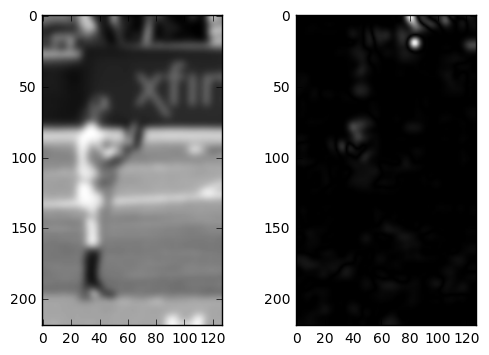

52
0.170352925481
43 27813
0.171684025803


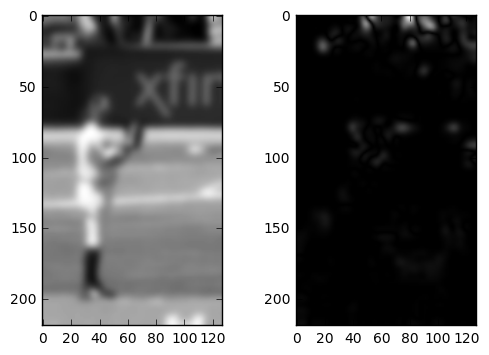

53
0.171018475642
0 27813
0.142212521292


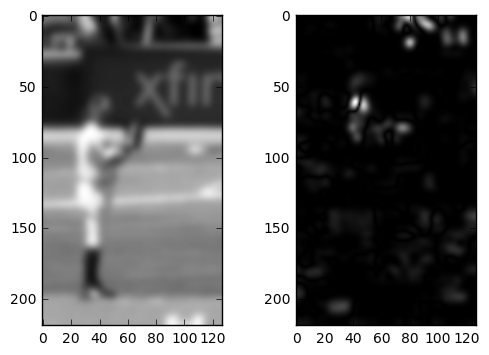

54
0.161416490859
61 27813
0.221933339073


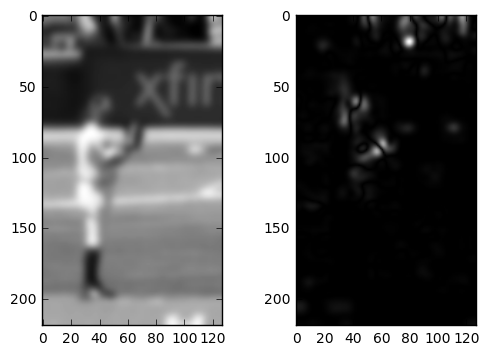

55
0.176545702912
192 27813
0.202964529013


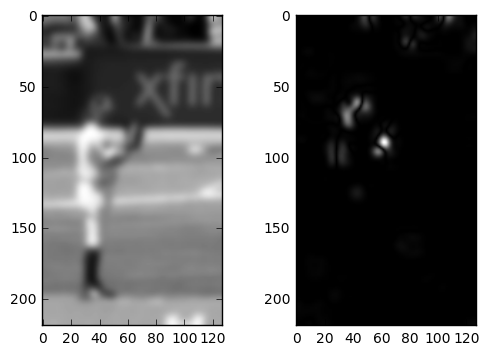

56
0.181829468132
255 27813
0.266890299963


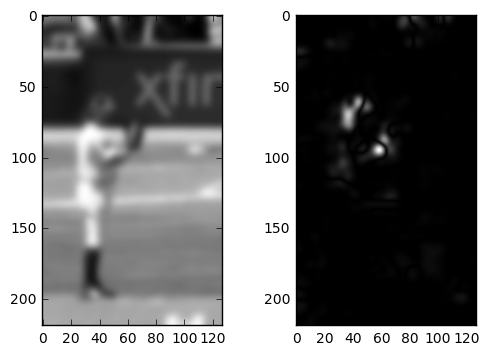

57
0.196006273437
202 27813
0.191613105793


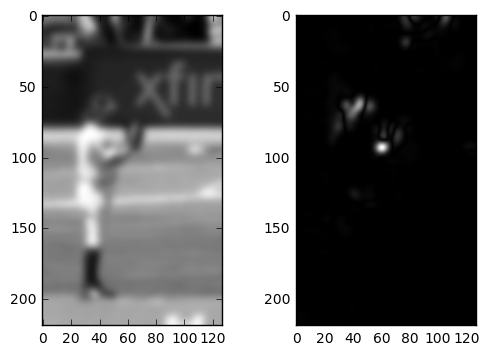

58
0.19537867806
279 27813
0.271815334804


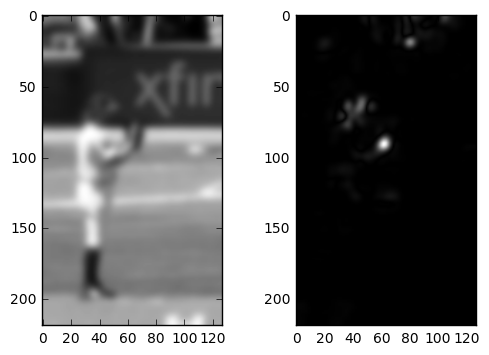

59
0.204933260153
139 27813
0.52464706793


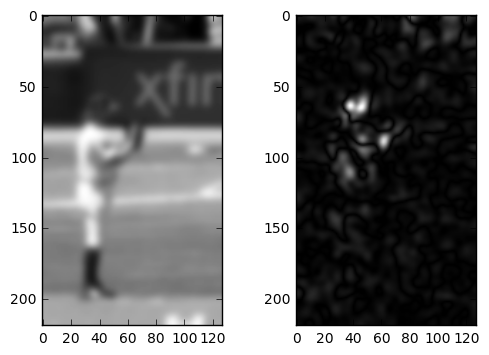

60
0.240457016572
74 27813
0.14137917578


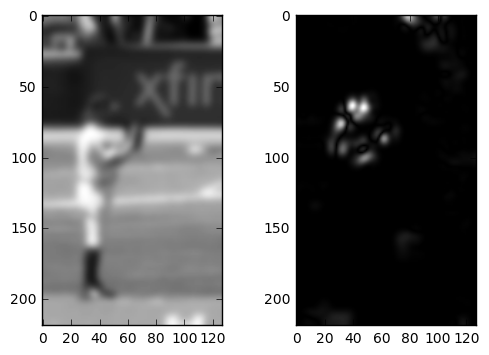

61
0.230549232493
12 27813
0.212189546419


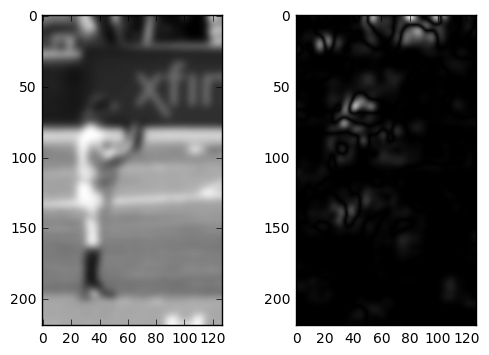

62
0.228880170123
36 27813
0.310813219873


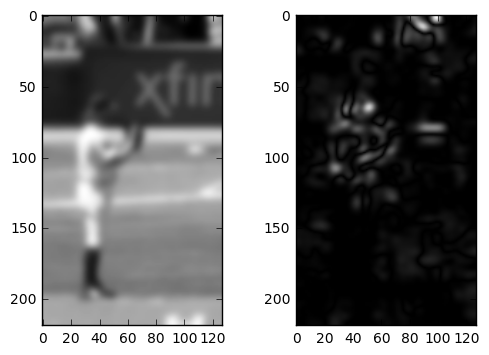

63
0.235707924269
11 27813
0.22384689742


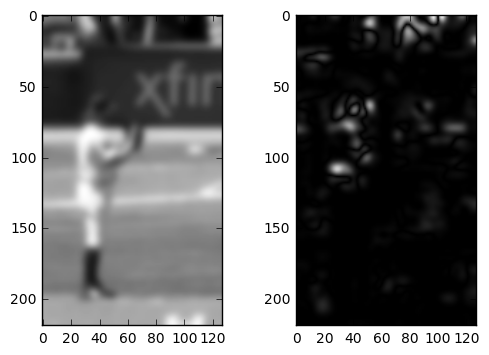

64
0.234795537588
0 27813
0.192918069627


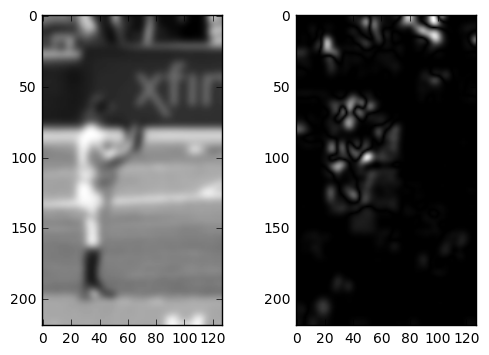

65
0.231804289877
27 27813
0.297889494463


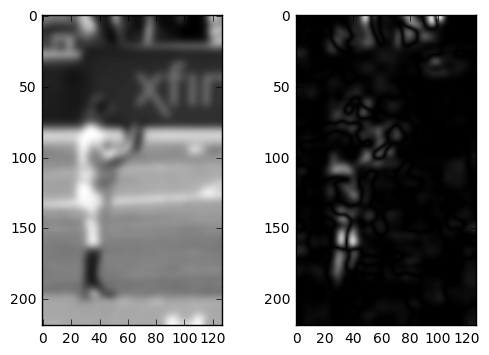

66
0.236209970182
187 27813
0.274619238235


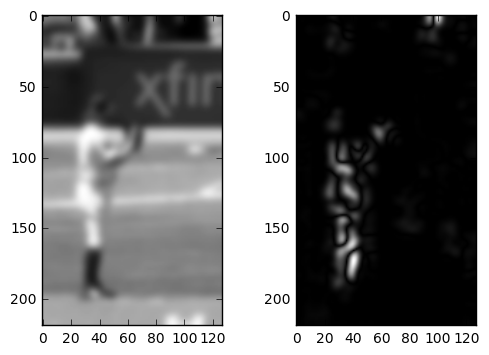

67
0.238610549436
626 27813
0.563347372956


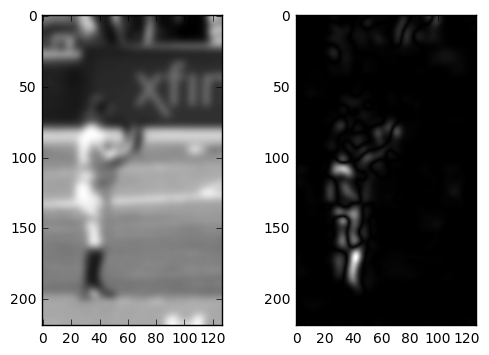

68
0.257712715525
1193 27813
0.773435369767


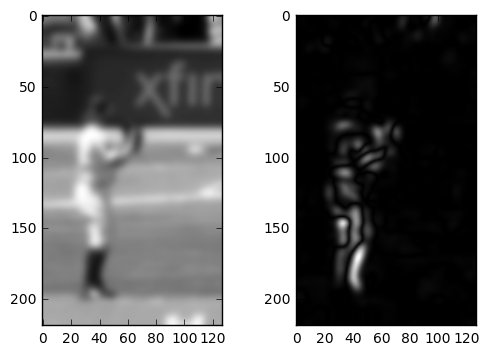

69
0.286363974094
1355 27813
0.785713722458


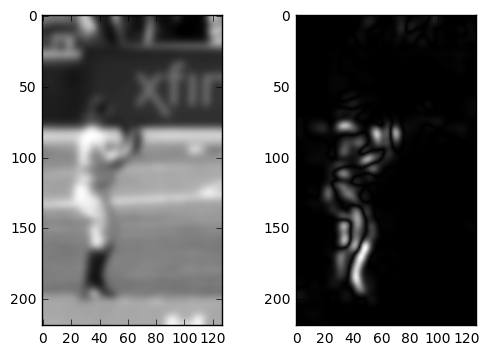

70
0.312645539797
1495 27813
0.902084802416


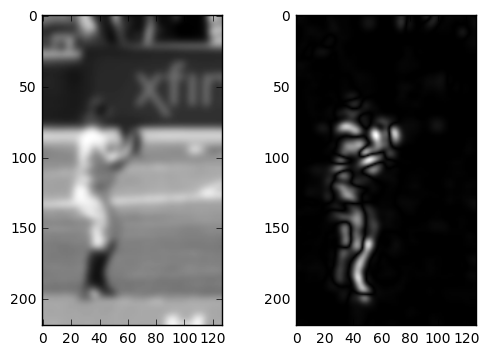

71
0.342117502928
1645 27813
1.09013685333


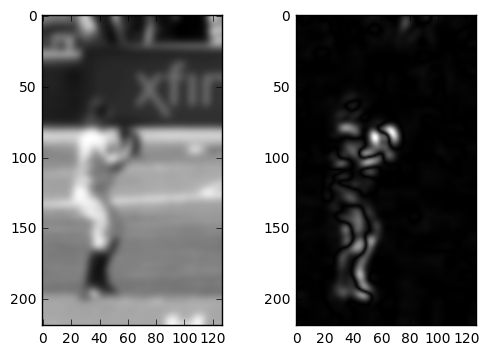

72
0.377737471995
1412 27813
0.923028061861


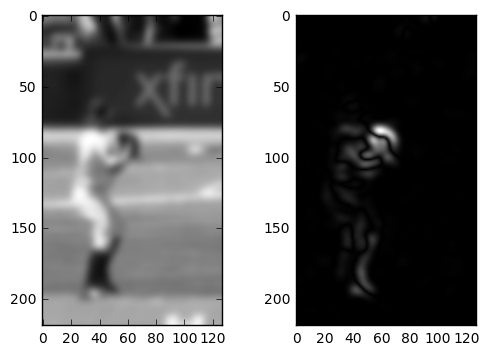

73
0.402523407898
1676 27813
1.29056825472


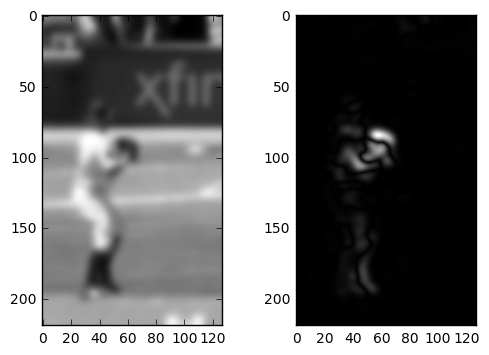

74
0.441134053412
1629 27813
1.35997423229


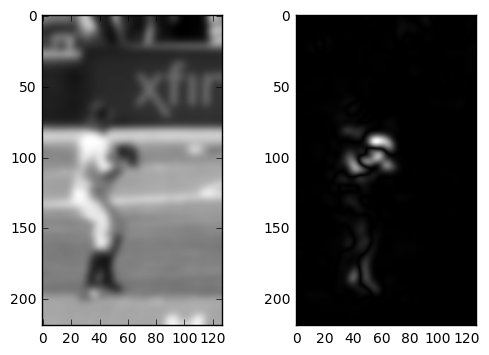

75
0.479419060865
1888 27813
1.39115898401


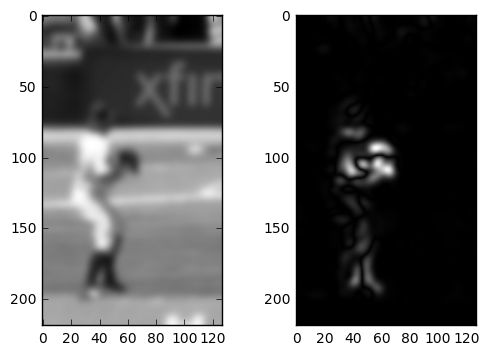

76
0.515888657791
2189 27813
1.52629406832


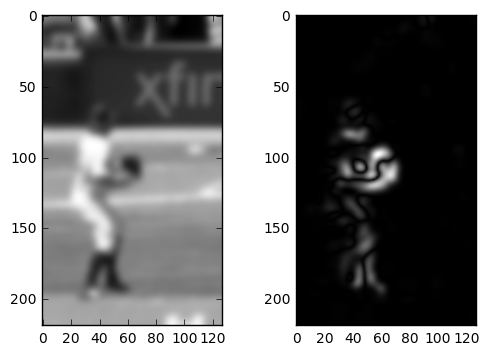

77
0.55475040435
2688 27813
2.02283412327


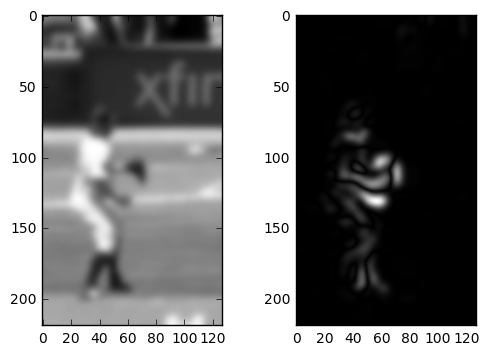

78
0.609123875421
2744 27813
1.9911622111


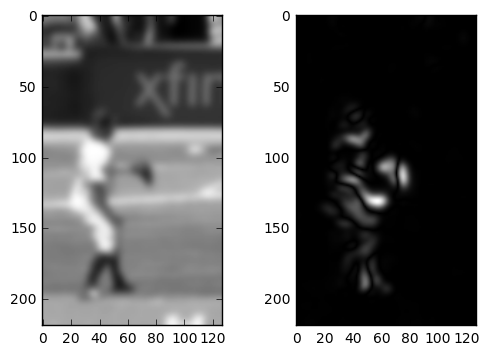

79
0.658482387409
2779 27813
2.04533996349


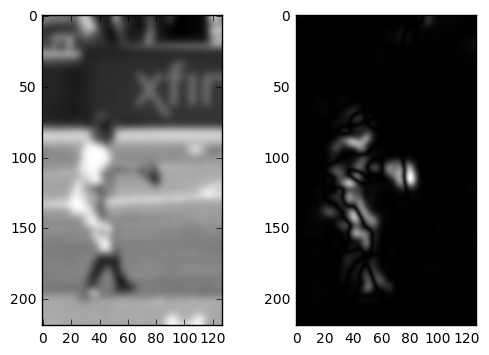

80
0.706305062447
2792 27813
1.94174717196
HERE


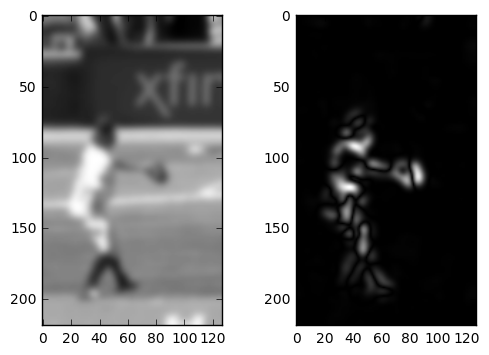

81
0.747486466097
2770 27813
1.84075166405


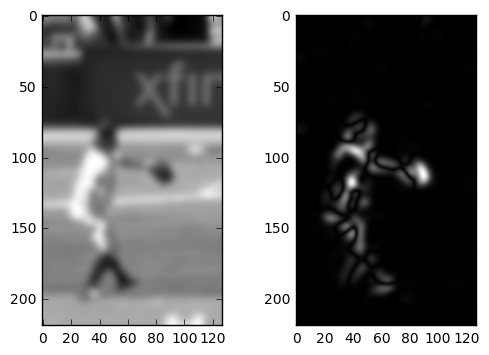

82
0.782753085386
2898 27813
1.70112840314
HERE


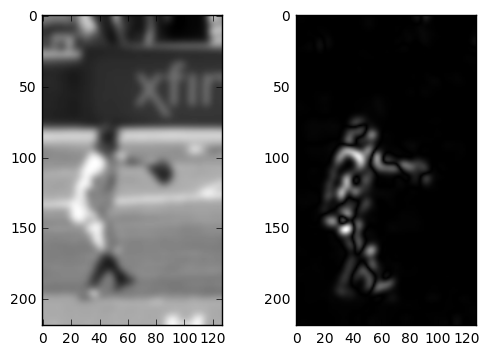

83
0.811452314066
3064 27813
2.22990547564
HERE


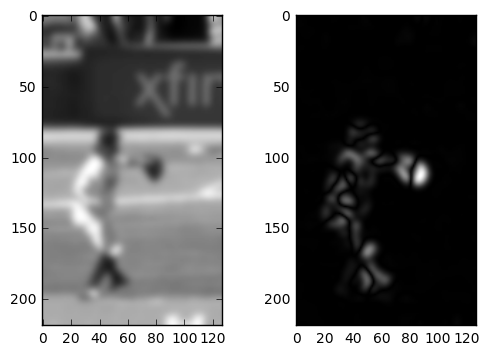

84
0.854435743204
2589 27813
2.0727789628


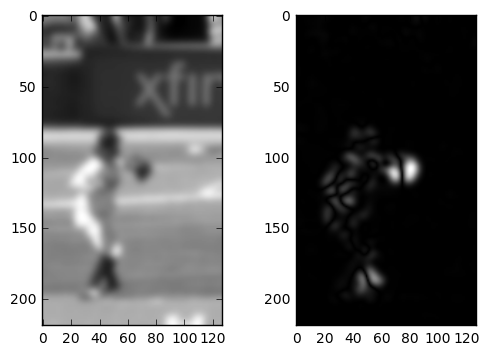

85
0.89026936731
2688 27813
2.24309692828


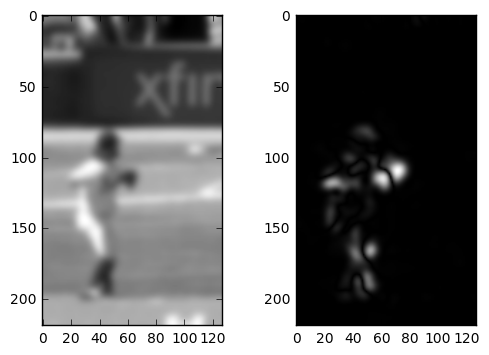

86
0.928921583337
2602 27813
2.43306988179


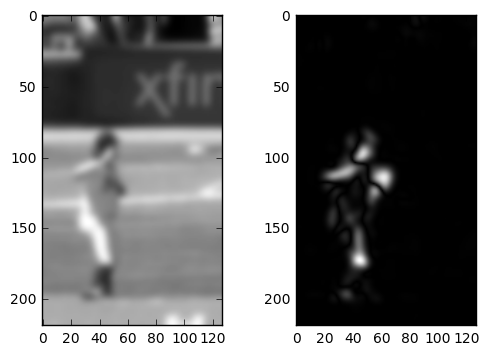

87
0.970703480517
2603 27813
2.2677075406


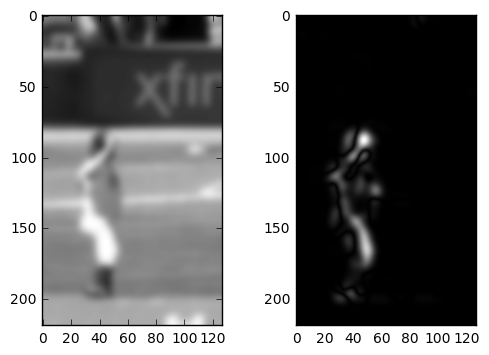

88
1.0057576443
3207 27813
3.22227024268
HERE


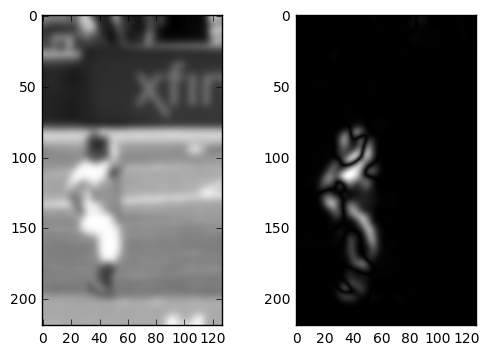

89
1.06408692321
3701 27813
3.75598066736
HERE


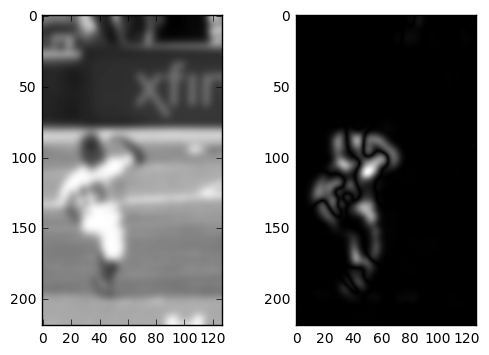

In [75]:
vid_path = "/Volumes/Nina Backup/videos/atl/2017-05-07/center field/490570-0c746c8e-b321-493b-85f6-b23b384b21a2.mp4"
#vid_path =  "/Users/ninawiedemann/Desktop/UNI/Praktikum/491122-f57ef71a-f2e2-453b-9e56-40c7d9ff2b4a.mp4"
#491122-fbbd3902-eae8-48dc-bec1-fbba7a3b581d.mp4" #491122-fbf1187f-8bcd-4ced-b28b-3132c5635f65.mp4"

KERNEL_SIZE = 15
DIFF = 2
FACTOR = 4
FAC2 = 1/10
video_capture = cv2.VideoCapture(vid_path)
diffs = []
for i in open(vid_path+".dat").readlines():
    datContent=ast.literal_eval(i)
bottom_p=datContent['Pitcher']['bottom']
left_p=datContent['Pitcher']['left']+80
right_p=datContent['Pitcher']['right']-80
top_p=datContent['Pitcher']['top'] #+130
frames = np.zeros((167, bottom_p-top_p, right_p-left_p))
nr_pix = frames.shape[1]*frames.shape[2]
i = 0
plt.figure()
while i<90:
    
    ret, frame = video_capture.read()
    if frame is None:
        break
    pitcher = frame[top_p:bottom_p, left_p:right_p]
    # print(pitcher.shape)
    pitcher = np.mean(pitcher, axis = 2)
    pitcher = cv2.GaussianBlur(pitcher,(KERNEL_SIZE,KERNEL_SIZE),0)
    frames[i]= pitcher
    if i > 50:
        print(i)
        mean_diff = np.mean(diffs)
        print(mean_diff)
        diff = np.mean(np.absolute(pitcher-frames[i-1]))
        higher5 = np.sum(np.absolute(pitcher-frames[i-1])>5)
        print(higher5, nr_pix)
        diffs.append(diff)
        print(diff)
        if np.sum(higher5)>FAC2*nr_pix: #diff> FACTOR* mean_diff: #DIFF:
            print("HERE")
        plt.subplot(121)
        plt.imshow(pitcher)
        plt.subplot(122)
        plt.imshow(np.absolute(pitcher-frames[i-1]))
        plt.gray()
        plt.show()
    i+=1

---------------------------NEW VIDEO-----------------------------
490570-08a4c347-a1c5-4ae9-941b-746c41be75d1.mp4
mean_diff: 0.267158440012
found 61
1.35466464862


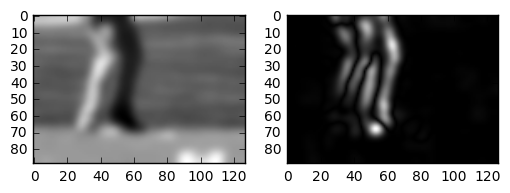

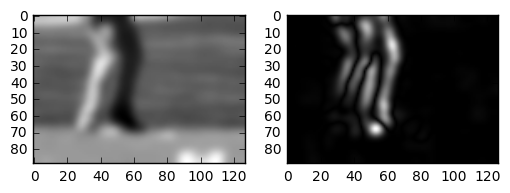

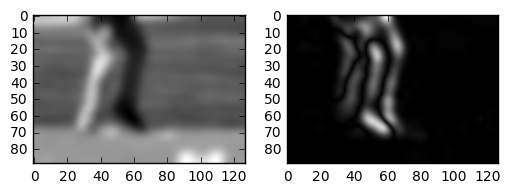

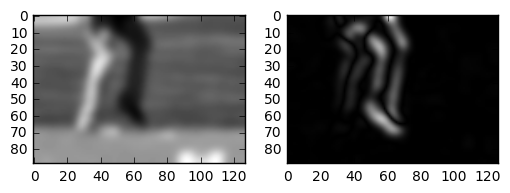

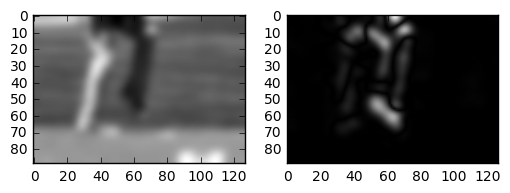

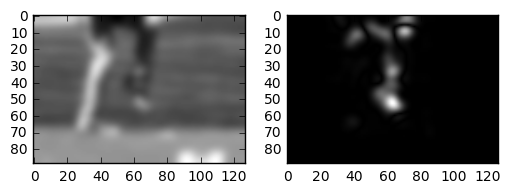

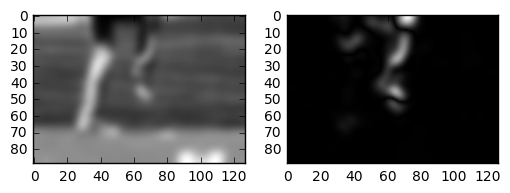

66 61
---------------------------NEW VIDEO-----------------------------
490570-0bb695ff-260b-4661-a9e5-73217cbb96e5.mp4
mean_diff: 0.260740346876
found 63
2.27777724894


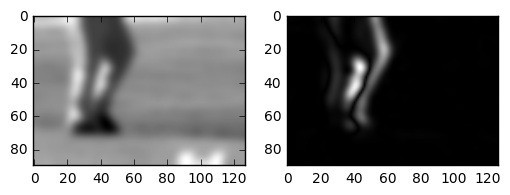

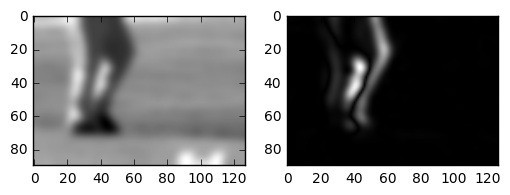

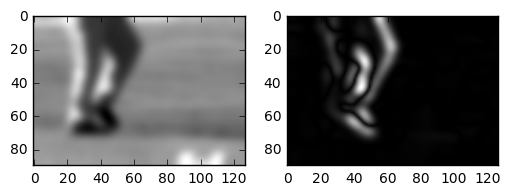

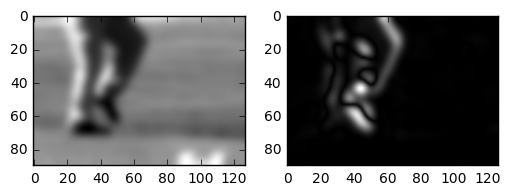

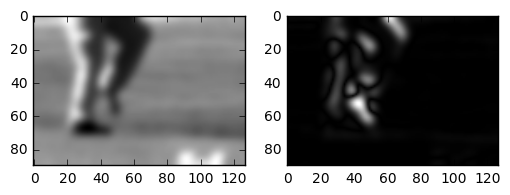

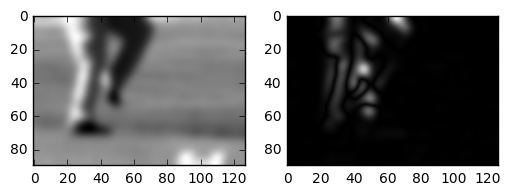

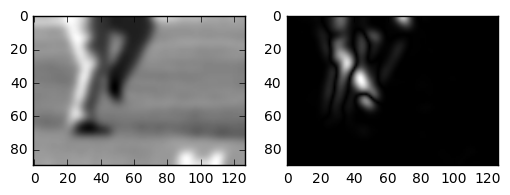

68 63
---------------------------NEW VIDEO-----------------------------
490570-0c746c8e-b321-493b-85f6-b23b384b21a2.mp4
mean_diff: 0.29949998623
found 78
2.12168406529


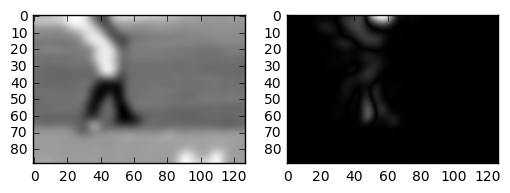

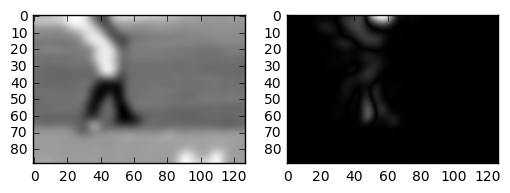

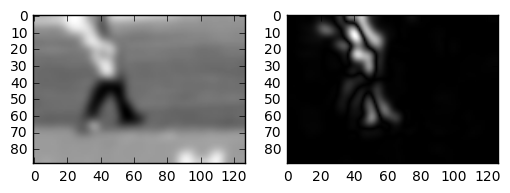

---------------------------NEW VIDEO-----------------------------
490570-0cc8c64c-29f6-41f7-aaa1-05f16252f14d.mp4
mean_diff: 0.217555031432
found 51
2.77023023031


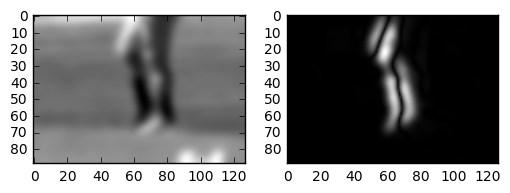

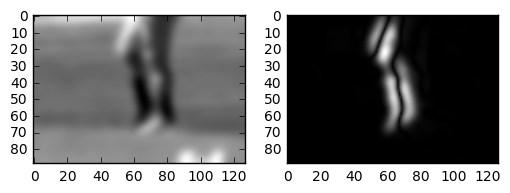

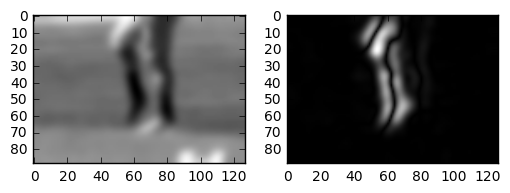

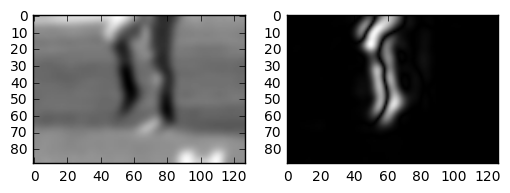

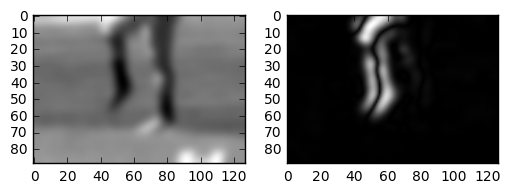

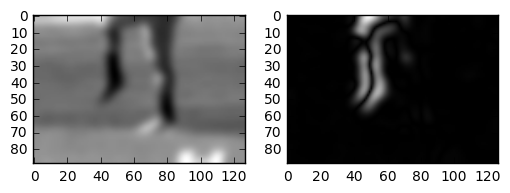

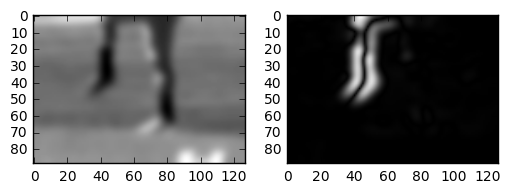

56 51
---------------------------NEW VIDEO-----------------------------
490570-0fad529c-f23e-404d-9f59-ea156cca547b.mp4
mean_diff: 0.134018094342
found 62
2.83542142707


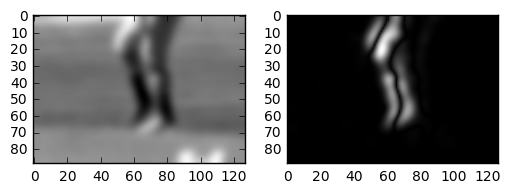

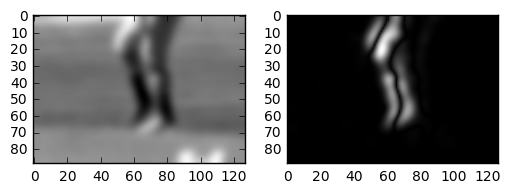

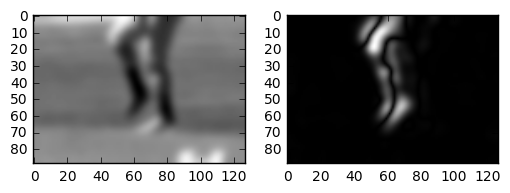

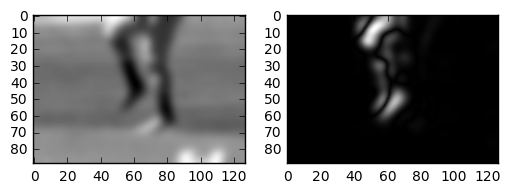

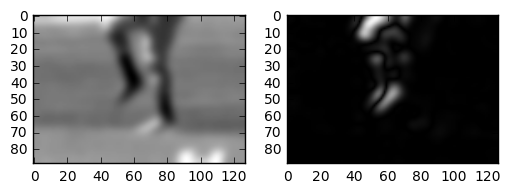

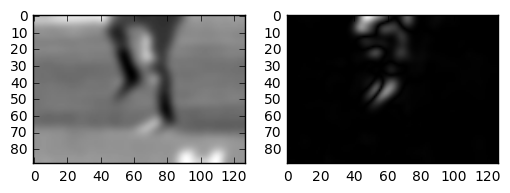

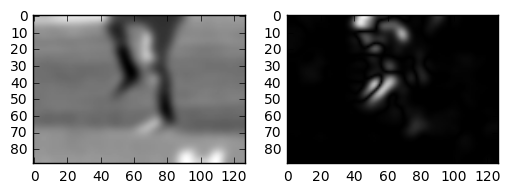

67 62
---------------------------NEW VIDEO-----------------------------
490570-12f10d47-ff20-4e61-a304-c08e778840a8.mp4
mean_diff: 0.244699929496
found 72
2.54800162413


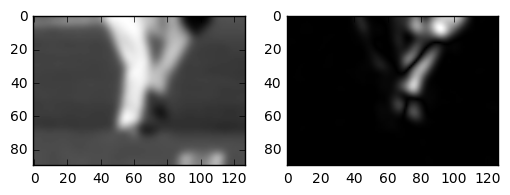

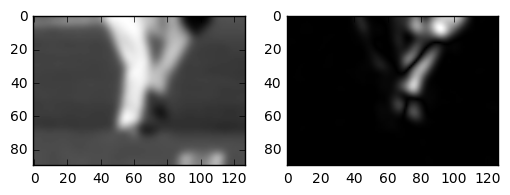

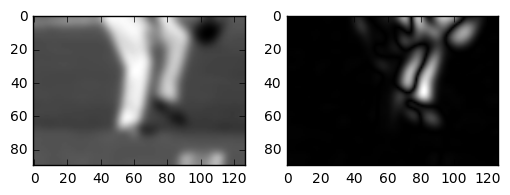

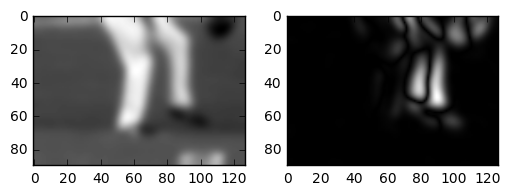

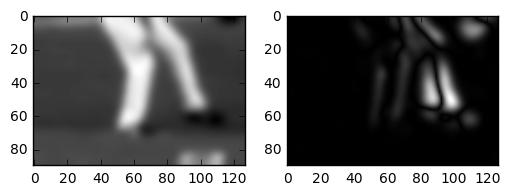

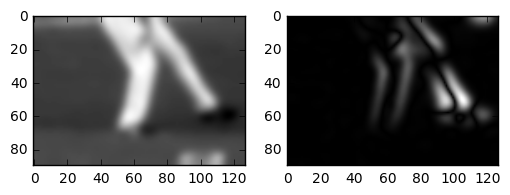

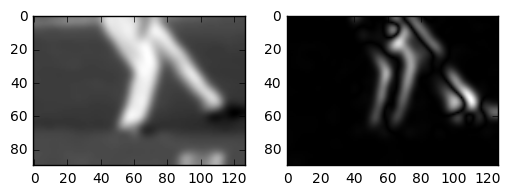

77 72
---------------------------NEW VIDEO-----------------------------
490570-13ac42ef-d384-421a-824e-8e45bda0447a.mp4
mean_diff: 0.126704742152
found 76
1.94129753228


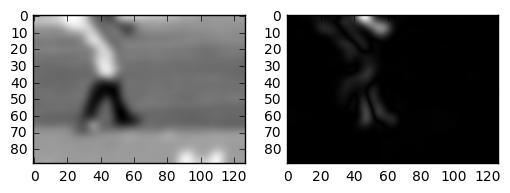

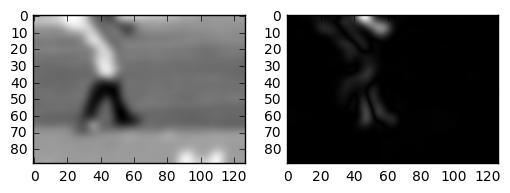

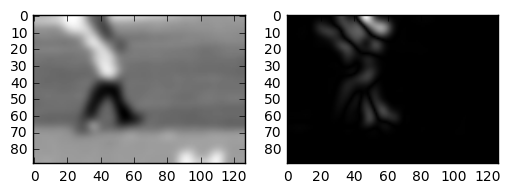

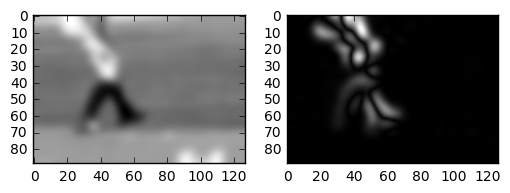

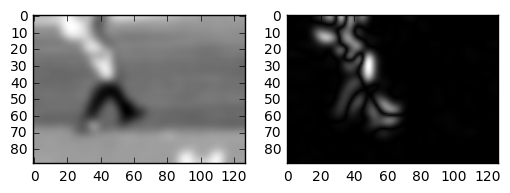

---------------------------NEW VIDEO-----------------------------
490570-150e1d19-abf5-41ca-afc0-e019dfb26b81.mp4
mean_diff: 0.714432551103
found 57
2.70955280104


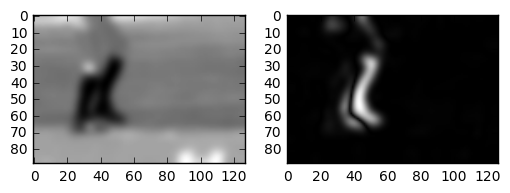

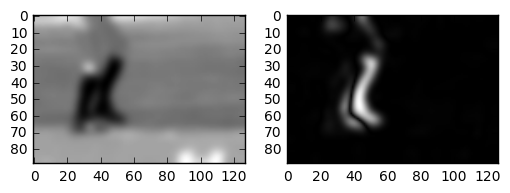

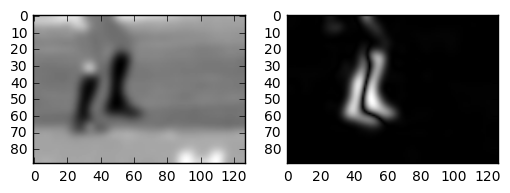

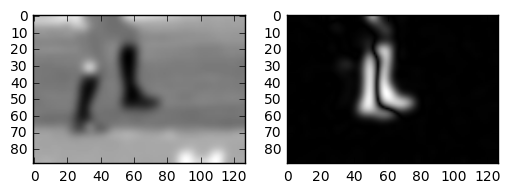

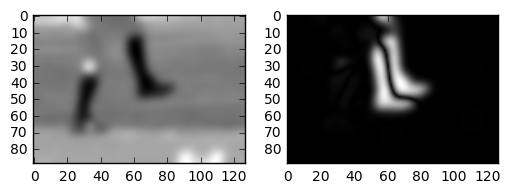

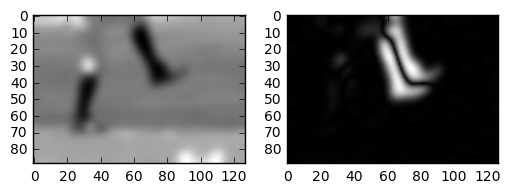

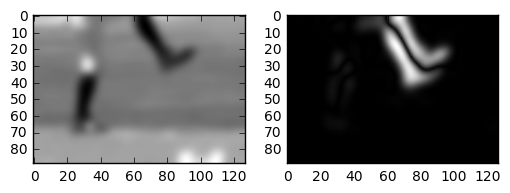

62 57
---------------------------NEW VIDEO-----------------------------
490570-153c02e0-ccda-44a1-8f08-8904347bd53e.mp4
mean_diff: 0.384142393749
found 65
2.61060048156


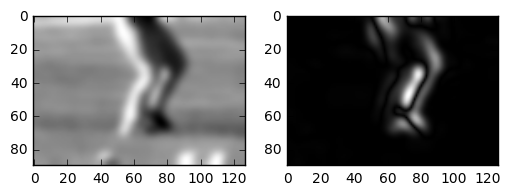

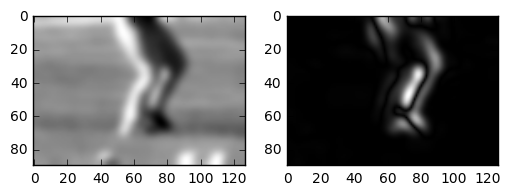

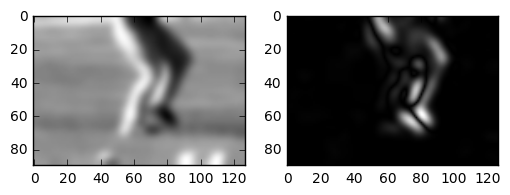

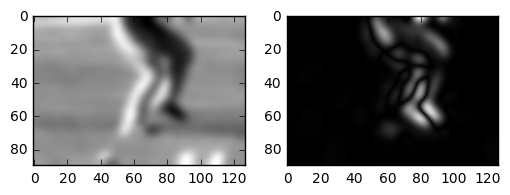

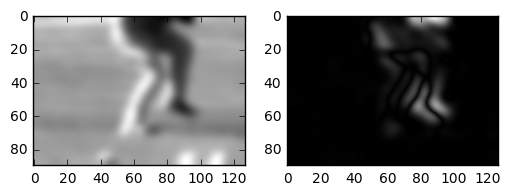

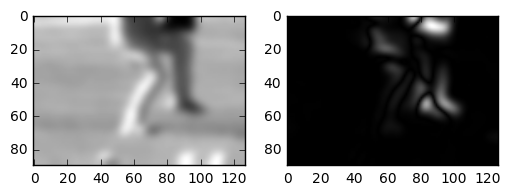

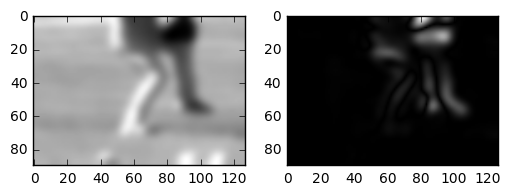

70 65
---------------------------NEW VIDEO-----------------------------
490570-155dca18-412c-4d52-b120-b698110d3862.mp4
mean_diff: 0.908724748097
found 59
2.17585643684


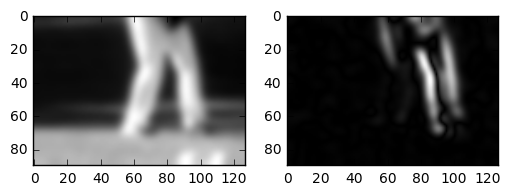

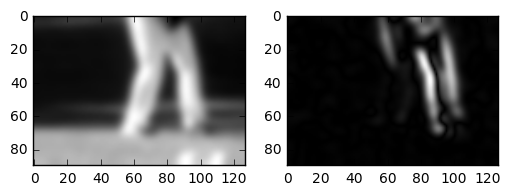

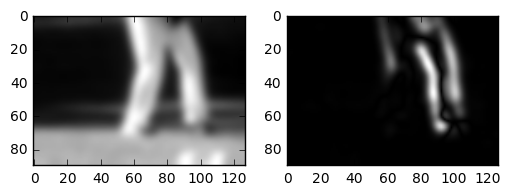

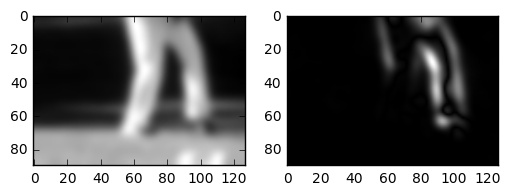

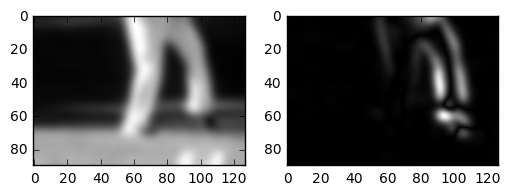

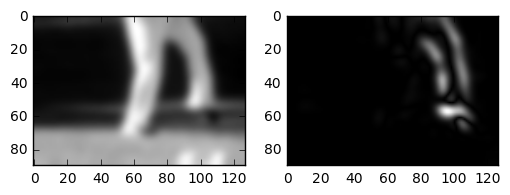

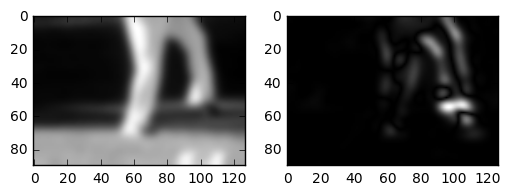

64 59
---------------------------NEW VIDEO-----------------------------
490570-164e58e6-ec14-445c-a59c-7e2566258318.mp4
mean_diff: 0.24744022971
found 52
1.99325138158


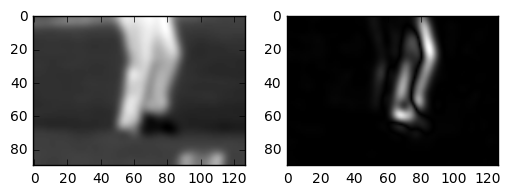

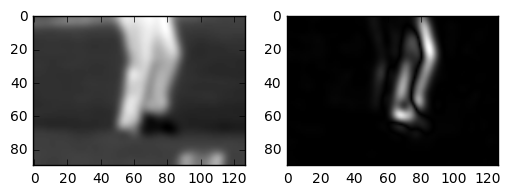

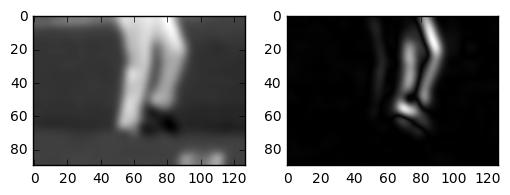

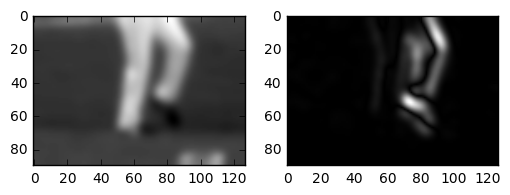

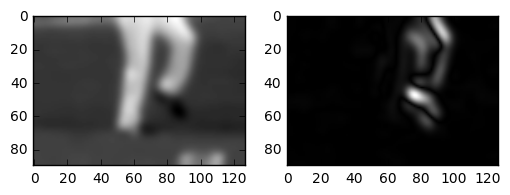

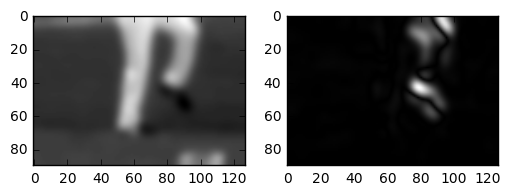

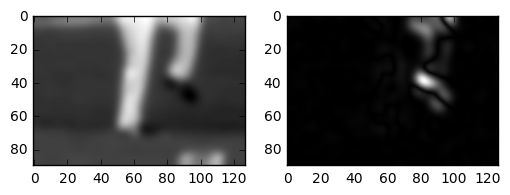

57 52
---------------------------NEW VIDEO-----------------------------
490570-16609c6c-a459-4f06-9765-3451fda76b06.mp4
mean_diff: 0.281746095443
found 75
1.95837957081


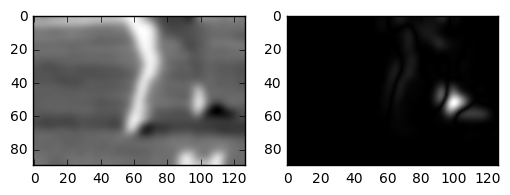

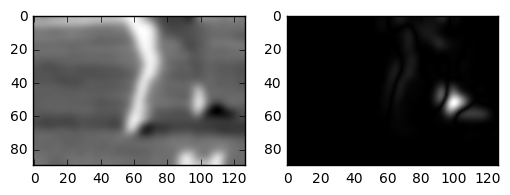

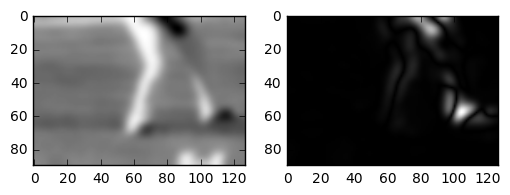

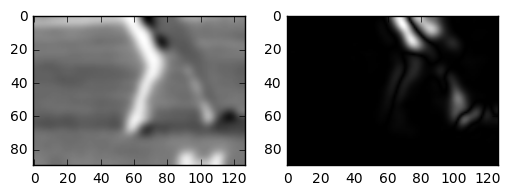

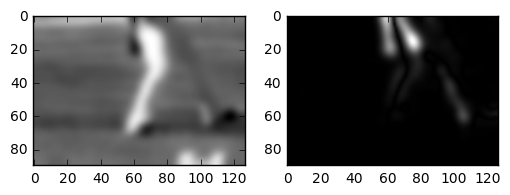

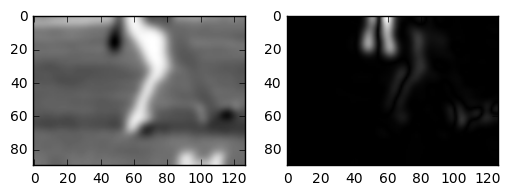

---------------------------NEW VIDEO-----------------------------
490570-17629e4d-7730-4979-93bc-49482d8a17ec.mp4
mean_diff: 0.165088738758
found 77
1.79168156915


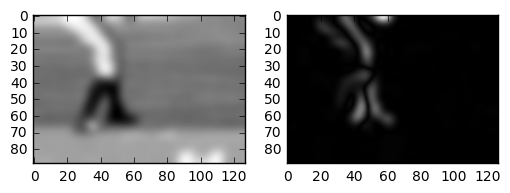

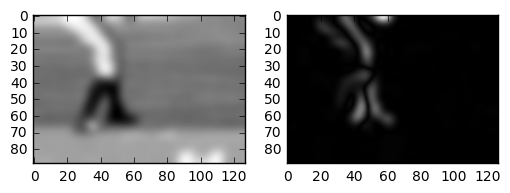

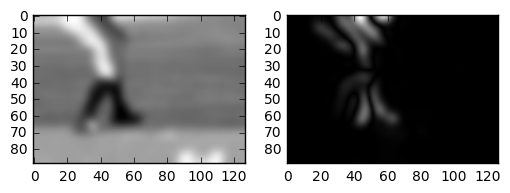

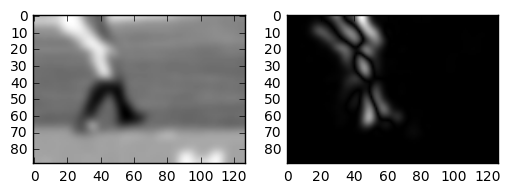

---------------------------NEW VIDEO-----------------------------
490570-1b4183e4-4e64-4240-8b2f-55df74b9e74d.mp4
mean_diff: 0.240368629949
found 50
2.19939832105


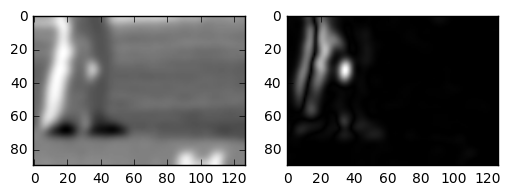

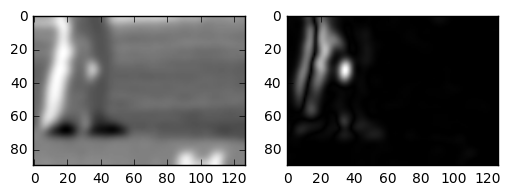

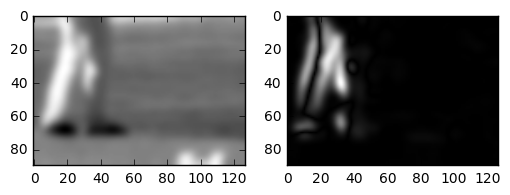

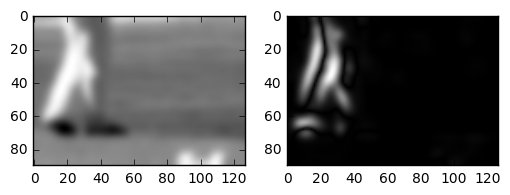

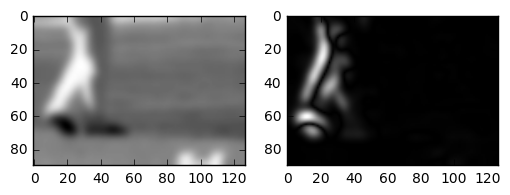

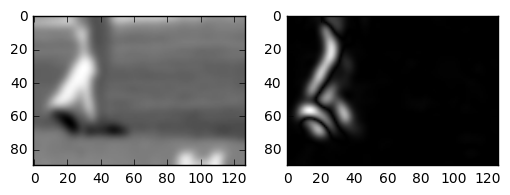

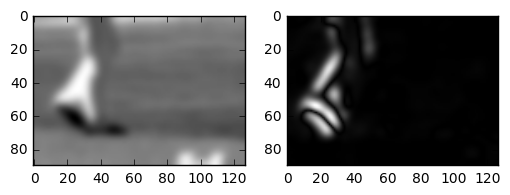

55 50
---------------------------NEW VIDEO-----------------------------
490570-1bdf923b-0b75-4bc0-8774-d28a941bfcfa.mp4
mean_diff: 0.375712557503
found 50
2.49204056931


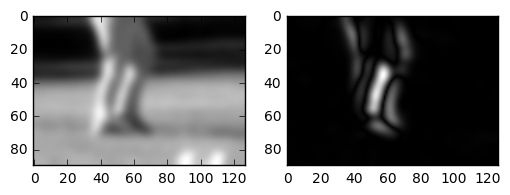

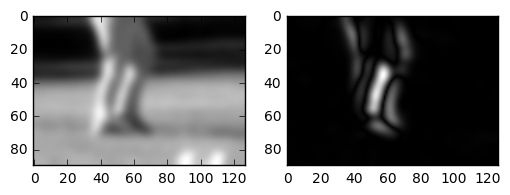

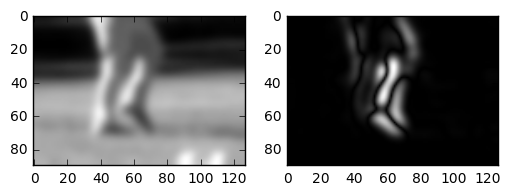

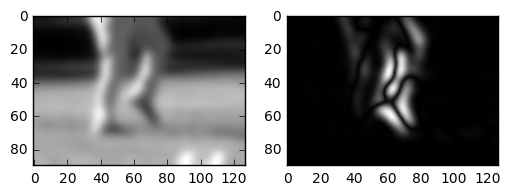

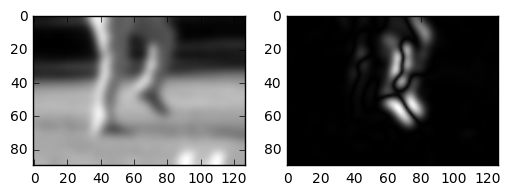

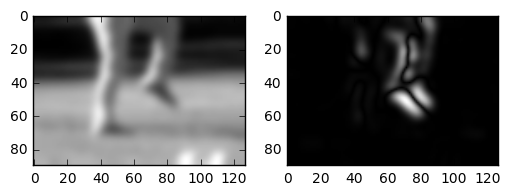

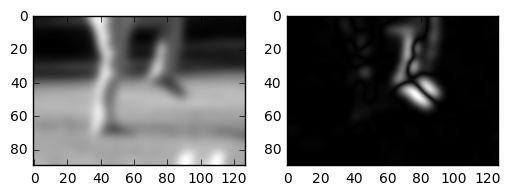

55 50
---------------------------NEW VIDEO-----------------------------
490570-1c208aef-9f83-4fdf-9838-db0ff362e79d.mp4
mean_diff: 0.737622851833
found 57
2.83898274348


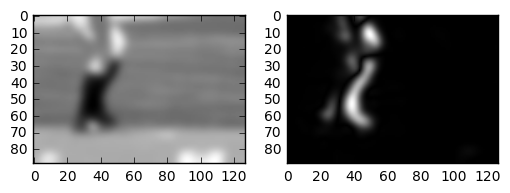

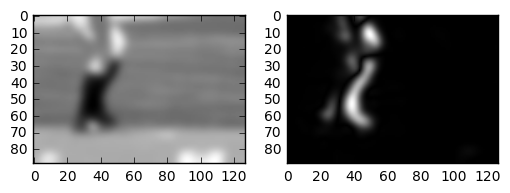

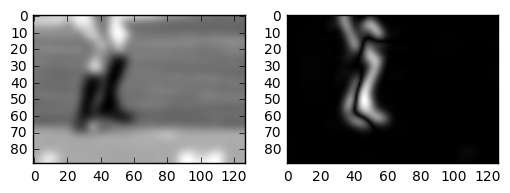

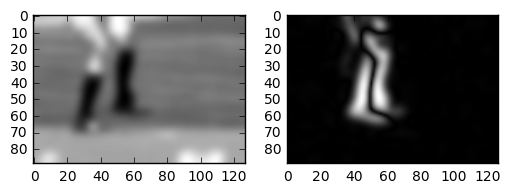

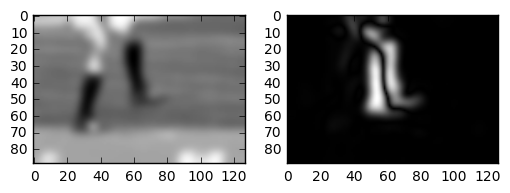

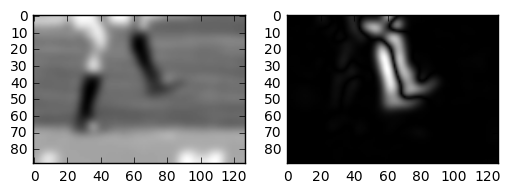

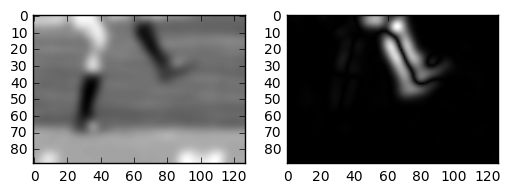

62 57
---------------------------NEW VIDEO-----------------------------
490570-1d1a0dfd-ffe9-459b-946c-3113986d3a17.mp4
mean_diff: 0.524929786539
found 60
2.72216053752


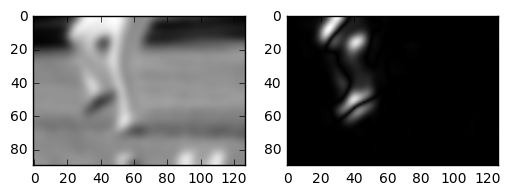

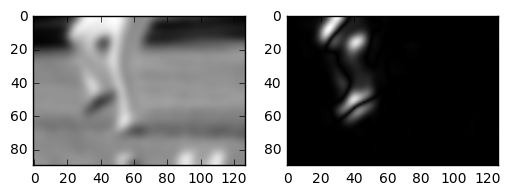

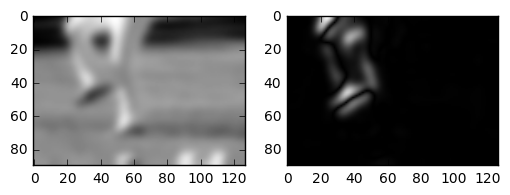

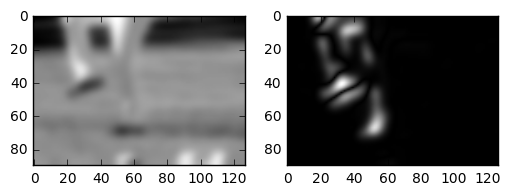

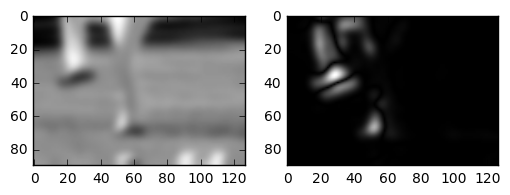

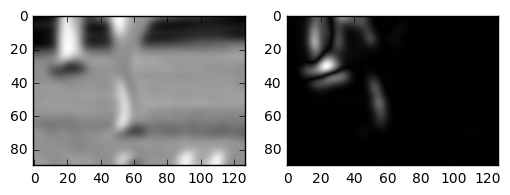

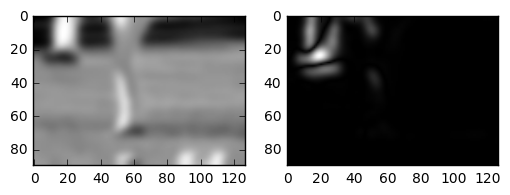

65 60
---------------------------NEW VIDEO-----------------------------
490570-1d5761ac-450d-48a6-bba9-79129ba338ba.mp4
mean_diff: 0.173497919153
found 76
2.20719706333


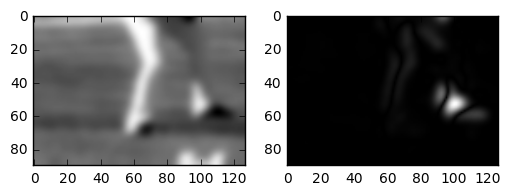

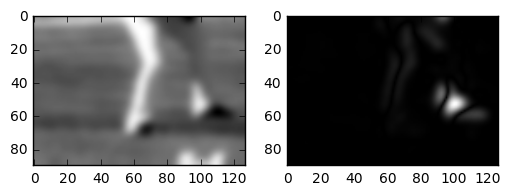

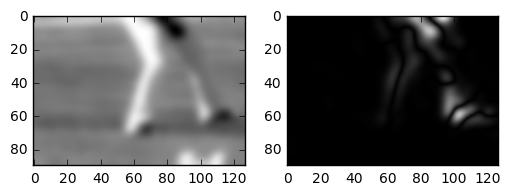

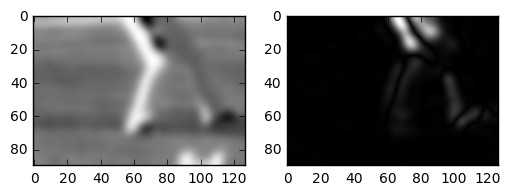

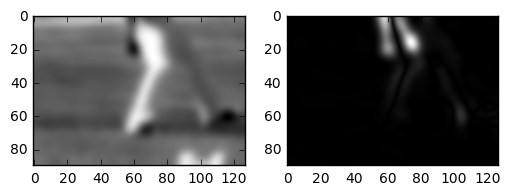

---------------------------NEW VIDEO-----------------------------
490570-1e686546-0a65-4b00-aaa1-83193a74c6eb.mp4
mean_diff: 0.554175340902
found 79
2.31922339898


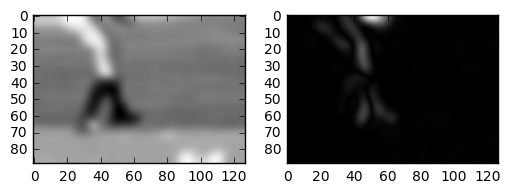

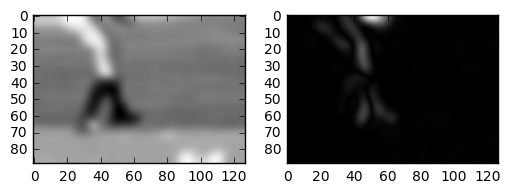

---------------------------NEW VIDEO-----------------------------
490570-21d95f77-f245-47d3-ae2e-0875383b50d9.mp4
mean_diff: 0.231964421802
found 52
2.48703546874


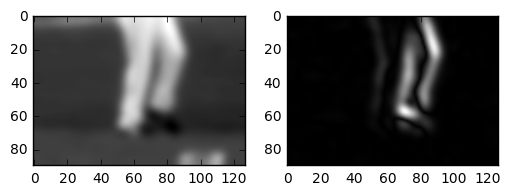

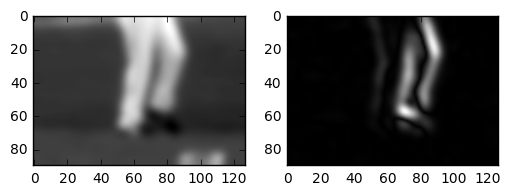

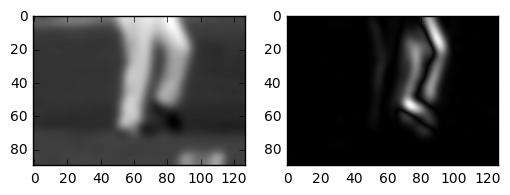

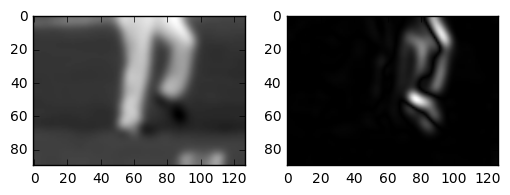

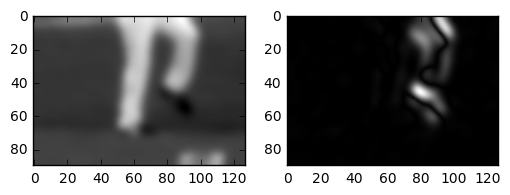

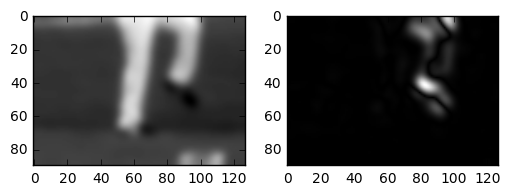

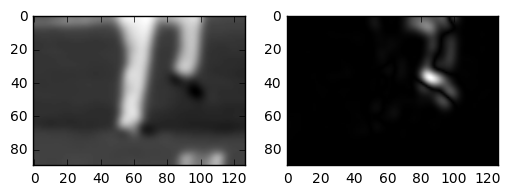

57 52
---------------------------NEW VIDEO-----------------------------
490570-22c9b198-7765-4f6e-8c6d-594e0aeb479f.mp4
mean_diff: 0.373478085693
found 65
1.4883958749


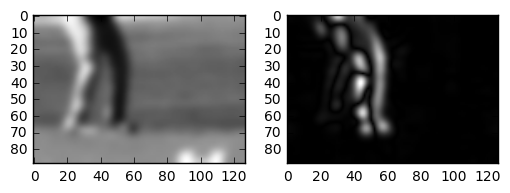

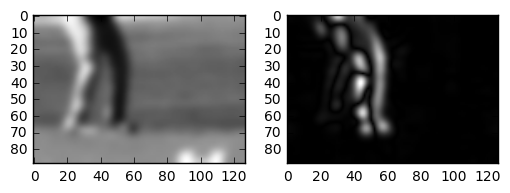

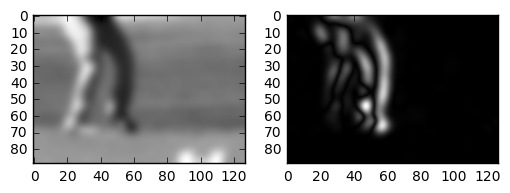

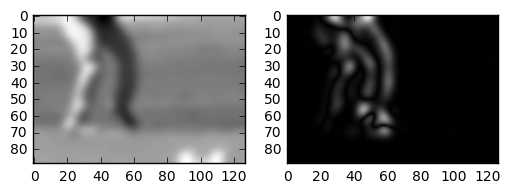

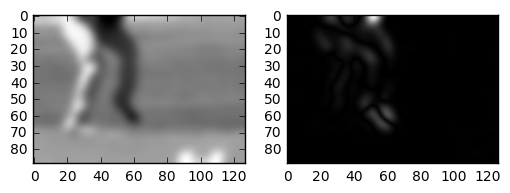

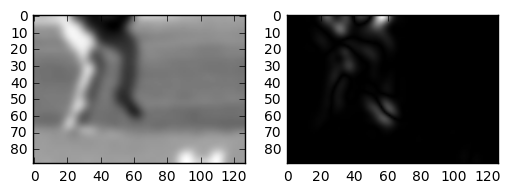

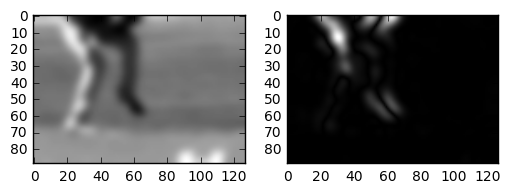

70 65
---------------------------NEW VIDEO-----------------------------
490570-2311f3e2-f778-4247-8a99-40ba8d8cb377.mp4
mean_diff: 0.502824785566
found 25
1.60841961188


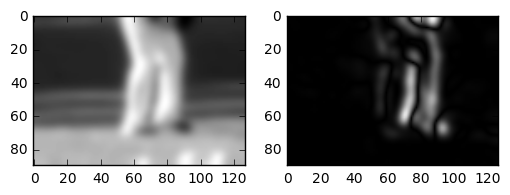

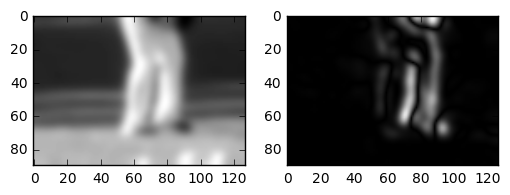

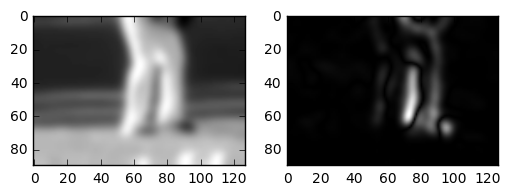

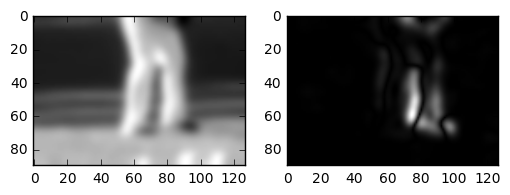

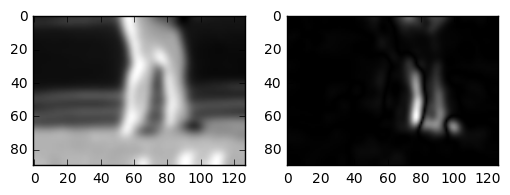

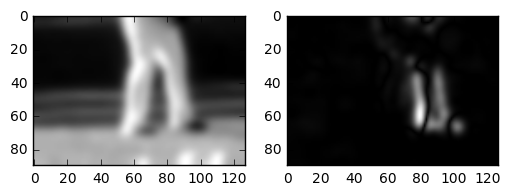

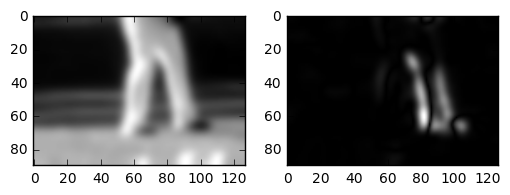

30 25
---------------------------NEW VIDEO-----------------------------
490570-241fe199-5bb9-4c83-926c-00e8e521055a.mp4
mean_diff: 0.14589228111
found 66
2.12513336853


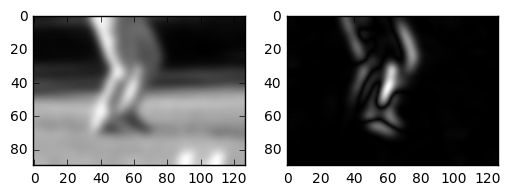

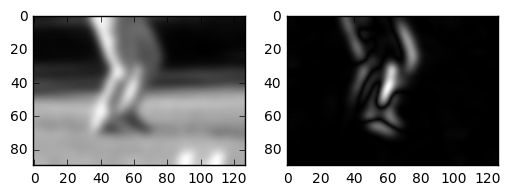

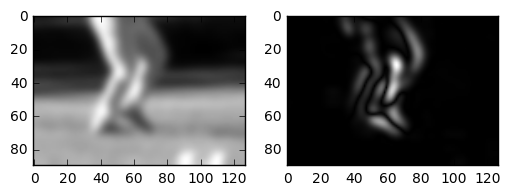

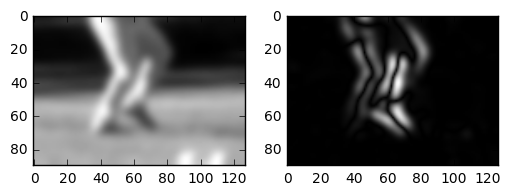

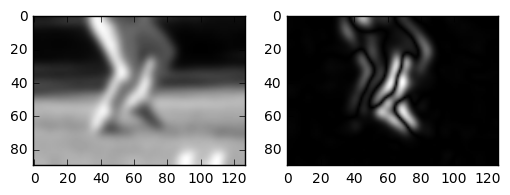

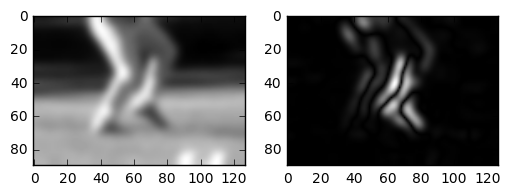

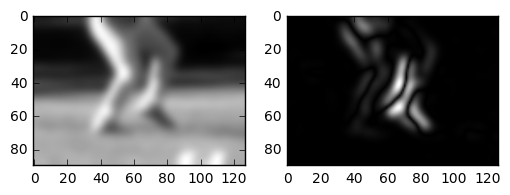

71 66
---------------------------NEW VIDEO-----------------------------
490570-24a4d979-161d-4268-8ba2-546d3d6e4a36.mp4
mean_diff: 0.585902052889
found 52
2.11681127397


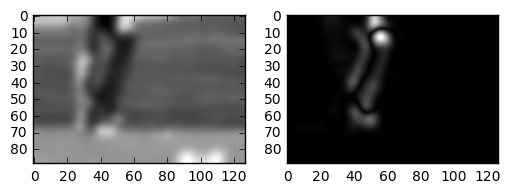

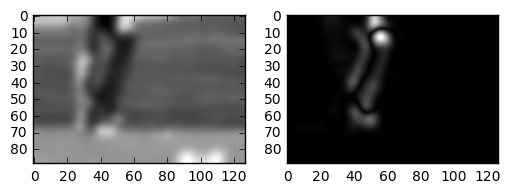

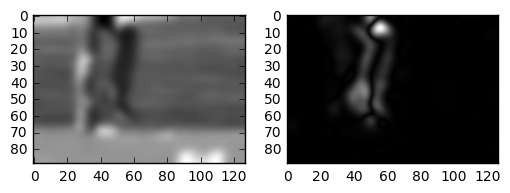

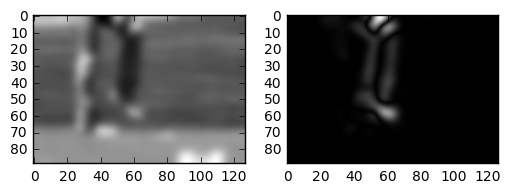

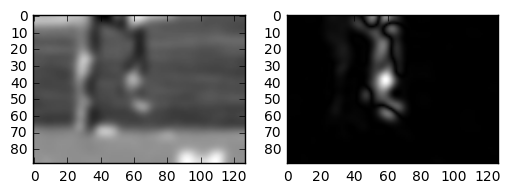

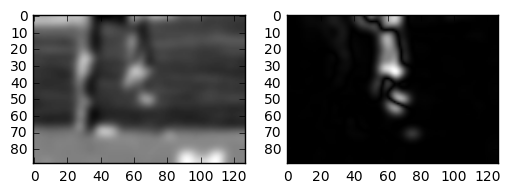

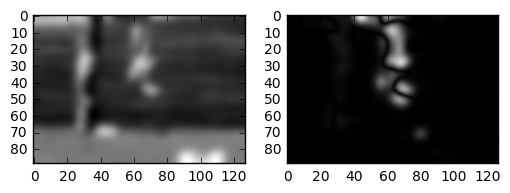

57 52
---------------------------NEW VIDEO-----------------------------
490570-2799f22c-2ce1-410b-8c89-e7bb978098b3.mp4
mean_diff: 0.316448090709
found 61
2.23700610696


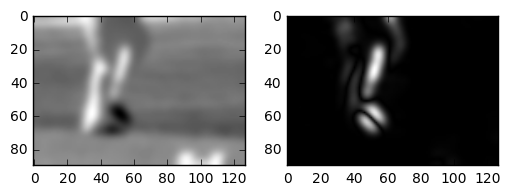

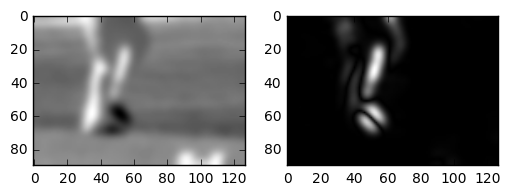

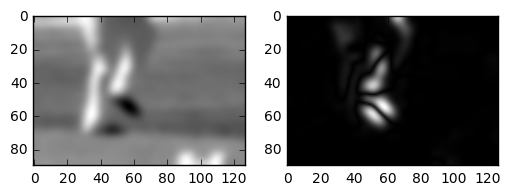

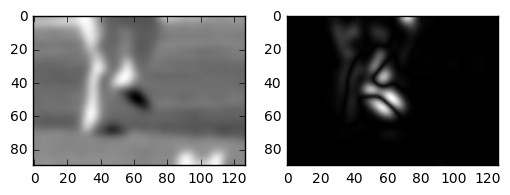

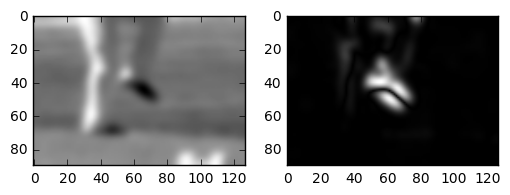

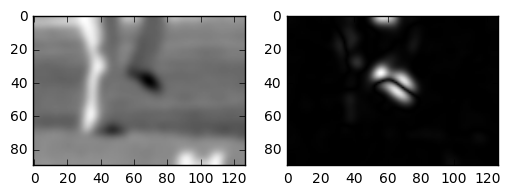

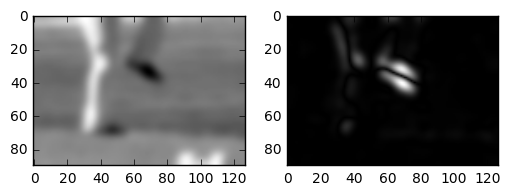

66 61
---------------------------NEW VIDEO-----------------------------
490570-289bb6b0-0809-407d-a1aa-649da20d0346.mp4
mean_diff: 0.691604513606
found 57
2.66472895997


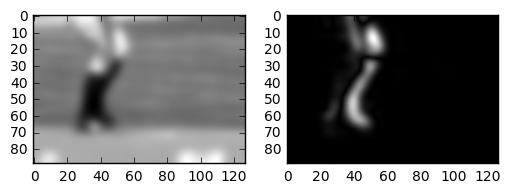

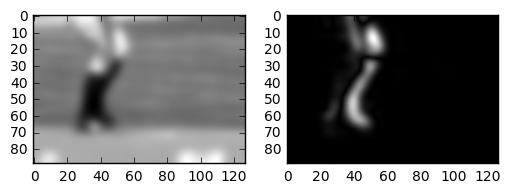

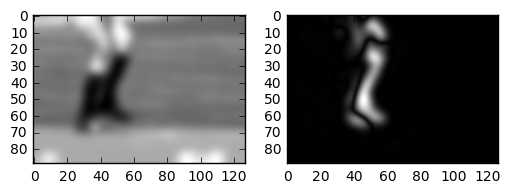

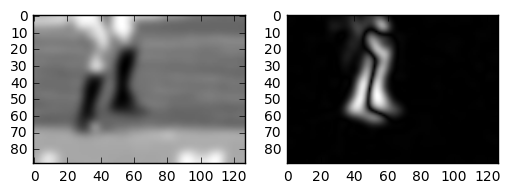

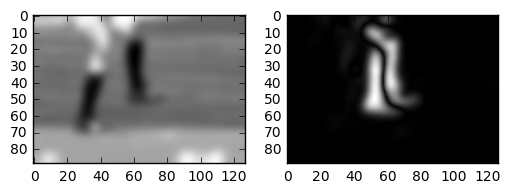

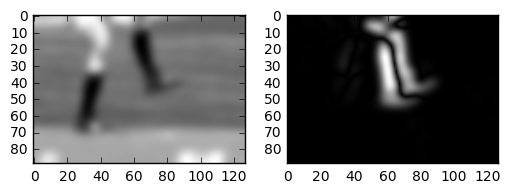

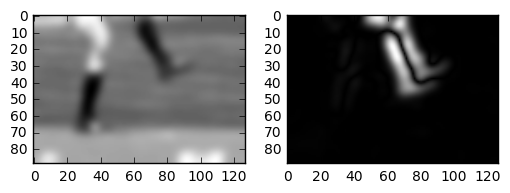

62 57
---------------------------NEW VIDEO-----------------------------
490570-29e9ba68-32fe-470c-bb35-080e29e67861.mp4
mean_diff: 0.199987013404
found 65
1.73538703283


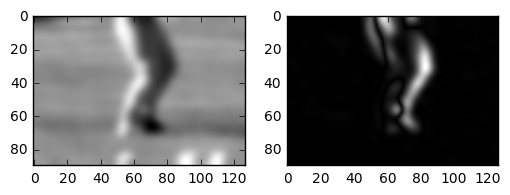

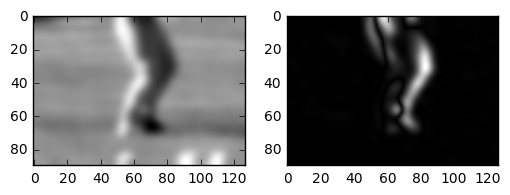

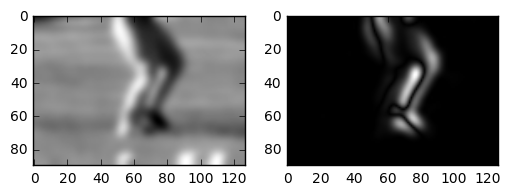

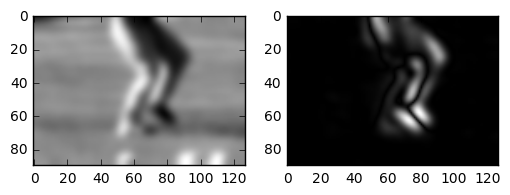

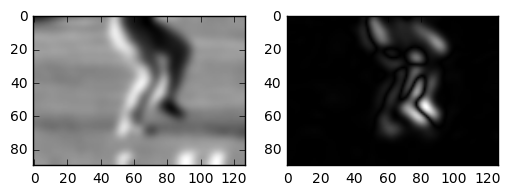

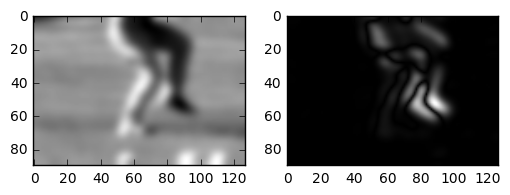

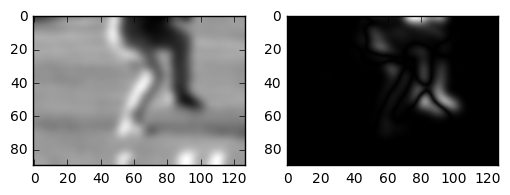

70 65
---------------------------NEW VIDEO-----------------------------
490570-2dade788-acb8-49b6-8148-20d0e64c330e.mp4
mean_diff: 0.155552849407
found 63
1.92854150699


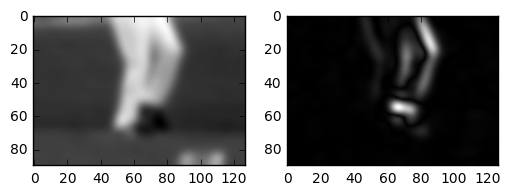

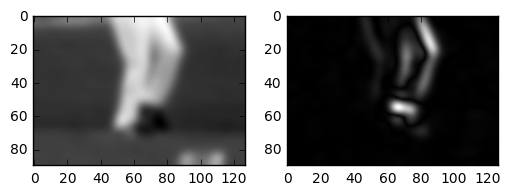

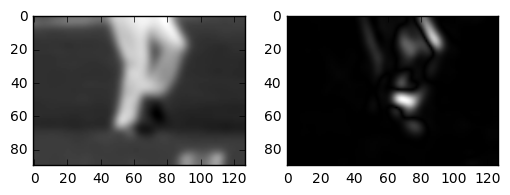

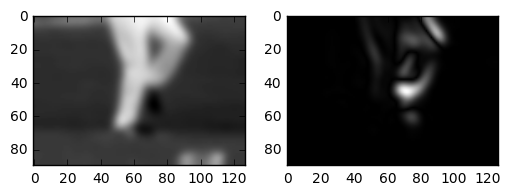

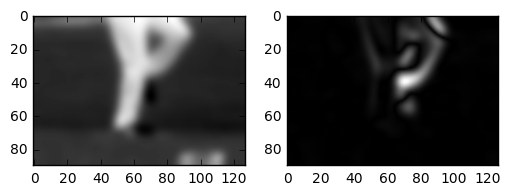

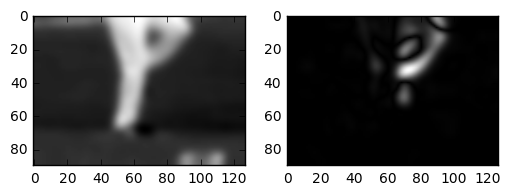

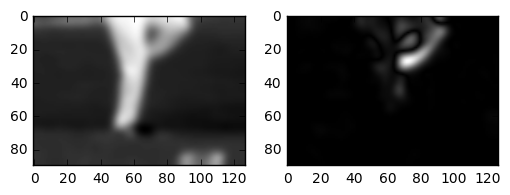

68 63
---------------------------NEW VIDEO-----------------------------
490570-2ec31031-8f6a-48ae-851a-1f856f288fbb.mp4


KeyboardInterrupt: 

In [73]:
from os import listdir
KERNEL_SIZE = 15
DIFF = 2
path = "/Volumes/Nina Backup/videos/atl/2017-05-07/center field/"

list_files = listdir(path)
start_frame = []

for f in list_files[10:]:
    mean_diff = 0
    diffs = []
    if f[-4:]==".mp4":
        print("---------------------------NEW VIDEO-----------------------------")
        print(f)
        video_capture = cv2.VideoCapture(path+f)
        for i in open(path+f+".dat").readlines():
            datContent=ast.literal_eval(i)
        bottom_p=datContent['Pitcher']['bottom']
        left_p=datContent['Pitcher']['left']+80
        right_p=datContent['Pitcher']['right']-80
        top_p=datContent['Pitcher']['top']+130
        frames = np.zeros((167, bottom_p-top_p, right_p-left_p))
        nr_pix = frames.shape[1]*frames.shape[2]
        i = 0
        found = False
        #plt.figure()
        while i<80:
            ret, frame = video_capture.read()
            if frame is None:
                break
            pitcher = frame[top_p:bottom_p, left_p:right_p]
            # print(pitcher.shape)
            pitcher = np.mean(pitcher, axis = 2)
            pitcher = cv2.GaussianBlur(pitcher,(KERNEL_SIZE,KERNEL_SIZE),0)
            frames[i]= pitcher
            if i==20 and not found:
                mean_diff = np.mean(diffs)
                print("mean_diff:", mean_diff)
            if i > 0:
                diff = np.mean(np.absolute(pitcher-frames[i-1]))
                higher5 = np.sum(np.absolute(pitcher-frames[i-1])>5)
                diffs.append(diff)
                #print(diff)
                if i>20 and np.sum(higher5)>FAC2*nr_pix and not found: # diff> 5*mean_diff
                        start_frame.append(i)
                        found = True
                        print("found", i)
                        print(diff)
                        plt.subplot(121)
                        plt.imshow(pitcher)
                        plt.subplot(122)
                        plt.imshow(np.absolute(pitcher-frames[i-1]))
                        plt.gray()
                        plt.show()
                if found:
                    plt.subplot(121)
                    plt.imshow(pitcher)
                    plt.subplot(122)
                    plt.imshow(np.absolute(pitcher-frames[i-1]))
                    plt.gray()
                    plt.show()
                    if i>start_frame[-1]+4:
                        print(i, start_frame[-1])
                        break
            i+=1

### NOTE:

Parameters:
* bounding box smaller, only around leg
* Gaussian blur kernel size 15 (try smaller/bigger ones)
* DIFF: difference in this area: took mean, but nonzero also possible


Results:
* 491122-fbbd3902-eae8-48dc-bec1-fbba7a3b581d.mp4: moves before the pitch, but too slow so my version works fine
* 491122-fbf1187f-8bcd-4ced-b28b-3132c5635f65.mp4: first one tested, works
* In general works fine, but some outliers that just don't reach the threshold level

Outliers:
* idea: first movement if k times the moving average
* count nonzero: -: speed not taken into account, +: not dependent on outliers/mean

In [ ]:
from os import listdir
KERNEL_SIZE = 15
DIFF = 2
path = "/Volumes/Nina Backup/videos/atl/2017-05-07/center field/"

list_files = listdir(path)
start_frame = []
fi = []

for f in list_files[10:]:
    mean_diff = 0
    diffs = []
    if f[-4:]==".mp4":
        print("---------------------------NEW VIDEO-----------------------------")
        print(f)
        fi.append(f)
        video_capture = cv2.VideoCapture(path+f)
        for i in open(path+f+".dat").readlines():
            datContent=ast.literal_eval(i)
        bottom_p=datContent['Pitcher']['bottom']
        left_p=datContent['Pitcher']['left']+80
        right_p=datContent['Pitcher']['right']-80
        top_p=datContent['Pitcher']['top']+130
        frames = np.zeros((167, bottom_p-top_p, right_p-left_p))
        nr_pix = frames.shape[1]*frames.shape[2]
        i = 0
        found = False
        #plt.figure()
        while True:
            ret, frame = video_capture.read()
            if frame is None:
                if not found:
                    start_frame.append(i)
                break
            pitcher = frame[top_p:bottom_p, left_p:right_p]
            # print(pitcher.shape)
            pitcher = np.mean(pitcher, axis = 2)
            pitcher = cv2.GaussianBlur(pitcher,(KERNEL_SIZE,KERNEL_SIZE),0)
            frames[i]= pitcher
            if i==20 and not found:
                mean_diff = np.mean(diffs)
                print("mean_diff:", mean_diff)
            if i > 0:
                diff = np.mean(np.absolute(pitcher-frames[i-1]))
                higher5 = np.sum(np.absolute(pitcher-frames[i-1])>5)
                diffs.append(diff)
                #print(diff)
                if i>20 and np.sum(higher5)>FAC2*nr_pix and not found: # diff> 5*mean_diff
                        start_frame.append(i)
                        found = True
            i+=1
print(len(fi), len(start_frame))

---------------------------NEW VIDEO-----------------------------
490570-08a4c347-a1c5-4ae9-941b-746c41be75d1.mp4
mean_diff: 0.267158440012
---------------------------NEW VIDEO-----------------------------
490570-0bb695ff-260b-4661-a9e5-73217cbb96e5.mp4
mean_diff: 0.260740346876
---------------------------NEW VIDEO-----------------------------
490570-0c746c8e-b321-493b-85f6-b23b384b21a2.mp4
mean_diff: 0.29949998623
---------------------------NEW VIDEO-----------------------------
490570-0cc8c64c-29f6-41f7-aaa1-05f16252f14d.mp4
